In [1]:
import anndata as ad             # For reading/writing AnnData files
import matplotlib.pyplot as plt  # For plotting
import metacells as mc           # The Metacells package
import numpy as np               # For array/matrix operations
import pandas as pd              # For data frames
import os                        # For filesystem operations
import seaborn as sb             # For plotting
import scipy.sparse as sp        # For sparse matrices
import shutil                    # for filesystem operations
from math import hypot           # For plotting
from typing import * 

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import scanpy as sc

In [3]:
adata = ad.read_h5ad("Great_Ape_MTG_public/chimp_cellxgene_obs.h5ad")

In [4]:
adata

AnnData object with n_obs × n_vars = 112929 × 56954
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', '...1', 'Cluster', 'Neighborhood', 'Subclass', 'CrossSpeciesCluster', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'tissue_ontology_term_id', 'is_primary_data', 'donor_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_id'
    var: 'name'

In [5]:
adata.obs['tissue']

SM-GE4WN_S162_E1-50                      middle temporal gyrus
SM-GE4WN_S164_E1-50                      middle temporal gyrus
SM-GE4WP_S019_E1-50                      middle temporal gyrus
SM-GE4WP_S022_E1-50                      middle temporal gyrus
SM-GE4WP_S086_E1-50                      middle temporal gyrus
                                                 ...          
TTTGTTGGTATAGGAT-14L8TX_191217_01_C07    middle temporal gyrus
TTTGTTGGTCTTTATC-14L8TX_191217_01_C07    middle temporal gyrus
TTTGTTGGTTGGGTAG-14L8TX_191217_01_C07    middle temporal gyrus
TTTGTTGGTTTGTGGT-14L8TX_191217_01_C07    middle temporal gyrus
TTTGTTGTCTCCTGAC-14L8TX_191217_01_C07    middle temporal gyrus
Name: tissue, Length: 112929, dtype: category
Categories (1, object): ['middle temporal gyrus']

In [6]:
adata.X.max()

45424.0

In [7]:
adata.obs['assay'].value_counts()

assay
10x 3' v3       109096
Smart-seq v4      3833
Name: count, dtype: int64

In [8]:
adata_10x = adata[adata.obs.assay == '10x 3\' v3']

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [9]:
adata_10x.obs

,orig.ident,nCount_RNA,nFeature_RNA,...1,Cluster,Neighborhood,Subclass,CrossSpeciesCluster,assay_ontology_term_id,cell_type_ontology_term_id,...,donor_id,cell_type,assay,disease,organism,sex,tissue,self_reported_ethnicity,development_stage,cell_id
AAACCCACATGAGAAT-1L8TX_190822_01_F11,SeuratProject,6572.0,2695.0,AAACCCACATGAGAAT-1L8TX_190822_01_F11,Oligo_1,glia,Oligo,Oligo_1,EFO:0009922,CL:0000128,...,C19.32.002,oligodendrocyte,10x 3' v3,normal,Pan troglodytes,female,middle temporal gyrus,na,prime adult stage,AAACCCACATGAGAAT-1L8TX_190822_01_F11
AAACCCAGTGACTGAG-1L8TX_190822_01_F11,SeuratProject,1649.0,1069.0,AAACCCAGTGACTGAG-1L8TX_190822_01_F11,Oligo_1,glia,Oligo,Oligo_1,EFO:0009922,CL:0000128,...,C19.32.002,oligodendrocyte,10x 3' v3,normal,Pan troglodytes,female,middle temporal gyrus,na,prime adult stage,AAACCCAGTGACTGAG-1L8TX_190822_01_F11
AAACCCATCCGTACGG-1L8TX_190822_01_F11,SeuratProject,1936.0,1364.0,AAACCCATCCGTACGG-1L8TX_190822_01_F11,Micro-PVM_1,glia,Micro-PVM,Micro-PVM_1,EFO:0009922,CL:0000129,...,C19.32.002,microglial cell,10x 3' v3,normal,Pan troglodytes,female,middle temporal gyrus,na,prime adult stage,AAACCCATCCGTACGG-1L8TX_190822_01_F11
AAACGAAAGGCCTTGC-1L8TX_190822_01_F11,SeuratProject,4743.0,2120.0,AAACGAAAGGCCTTGC-1L8TX_190822_01_F11,Oligo_1,glia,Oligo,Oligo_1,EFO:0009922,CL:0000128,...,C19.32.002,oligodendrocyte,10x 3' v3,normal,Pan troglodytes,female,middle temporal gyrus,na,prime adult stage,AAACGAAAGGCCTTGC-1L8TX_190822_01_F11
AAACGAATCATCGCTC-1L8TX_190822_01_F11,SeuratProject,4899.0,2310.0,AAACGAATCATCGCTC-1L8TX_190822_01_F11,Astro_1,glia,Astro,Astro_1,EFO:0009922,CL:0002605,...,C19.32.002,astrocyte of the cerebral cortex,10x 3' v3,normal,Pan troglodytes,female,middle temporal gyrus,na,prime adult stage,AAACGAATCATCGCTC-1L8TX_190822_01_F11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTATAGGAT-14L8TX_191217_01_C07,SeuratProject,14029.0,4624.0,TTTGTTGGTATAGGAT-14L8TX_191217_01_C07,L2/3 IT_3,it_types,L2/3 IT,L2/3 IT_1,EFO:0009922,CL:4023040,...,C19.32.007,L2/3-6 intratelencephalic projecting glutamate...,10x 3' v3,normal,Pan troglodytes,female,middle temporal gyrus,na,prime adult stage,TTTGTTGGTATAGGAT-14L8TX_191217_01_C07
TTTGTTGGTCTTTATC-14L8TX_191217_01_C07,SeuratProject,40515.0,7989.0,TTTGTTGGTCTTTATC-14L8TX_191217_01_C07,L5 IT_3,it_types,L5 IT,L5 IT_2,EFO:0009922,CL:4023040,...,C19.32.007,L2/3-6 intratelencephalic projecting glutamate...,10x 3' v3,normal,Pan troglodytes,female,middle temporal gyrus,na,prime adult stage,TTTGTTGGTCTTTATC-14L8TX_191217_01_C07
TTTGTTGGTTGGGTAG-14L8TX_191217_01_C07,SeuratProject,19032.0,5918.0,TTTGTTGGTTGGGTAG-14L8TX_191217_01_C07,L4 IT_1,it_types,L4 IT,L4 IT_1,EFO:0009922,CL:4023040,...,C19.32.007,L2/3-6 intratelencephalic projecting glutamate...,10x 3' v3,normal,Pan troglodytes,female,middle temporal gyrus,na,prime adult stage,TTTGTTGGTTGGGTAG-14L8TX_191217_01_C07
TTTGTTGGTTTGTGGT-14L8TX_191217_01_C07,SeuratProject,21077.0,5794.0,TTTGTTGGTTTGTGGT-14L8TX_191217_01_C07,L4 IT_1,it_types,L4 IT,L4 IT_1,EFO:0009922,CL:4023040,...,C19.32.007,L2/3-6 intratelencephalic projecting glutamate...,10x 3' v3,normal,Pan troglodytes,female,middle temporal gyrus,na,prime adult stage,TTTGTTGGTTTGTGGT-14L8TX_191217_01_C07


In [10]:
full = adata_10x
mc.ut.top_level(full)
mc.ut.set_name(full, "chimp_mtg_full")
print(f"Full: {full.n_obs} cells, {full.n_vars} genes")

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/contextlib.py:144: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


Full: 109096 cells, 56954 genes


In [11]:
PROPERLY_SAMPLED_MIN_CELL_TOTAL = 200
PROPERLY_SAMPLED_MAX_CELL_TOTAL = 200000

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


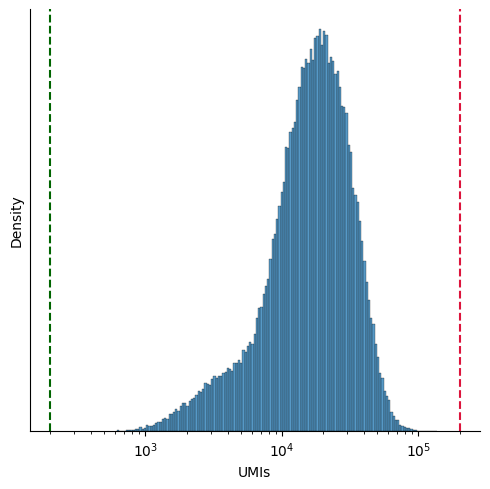

In [12]:
total_umis_per_cell = mc.ut.get_o_numpy(full, "__x__", sum=True)
plot = sb.displot(total_umis_per_cell, log_scale=(10, None))
plot.set(xlabel="UMIs", ylabel="Density", yticks=[])

plot.refline(x=PROPERLY_SAMPLED_MIN_CELL_TOTAL, color="darkgreen")
plot.refline(x=PROPERLY_SAMPLED_MAX_CELL_TOTAL, color="crimson")

In [13]:
## since the data is filtered by cellxgene and the author I do not exclude any cell types here

In [14]:
too_small_cells_count = np.sum(total_umis_per_cell < PROPERLY_SAMPLED_MIN_CELL_TOTAL)
too_large_cells_count = np.sum(total_umis_per_cell > PROPERLY_SAMPLED_MAX_CELL_TOTAL)

total_umis_per_cell = mc.ut.get_o_numpy(full, name="__x__", sum=True)
too_small_cells_percent = 100.0 * too_small_cells_count / full.n_obs
too_large_cells_percent = 100.0 * too_large_cells_count / full.n_vars

print(
    f"Will exclude {too_small_cells_count} ({too_small_cells_percent:.2f}%%) cells"
    f" with less than {PROPERLY_SAMPLED_MIN_CELL_TOTAL} UMIs"
)
print(
    f"Will exclude {too_large_cells_count} ({too_large_cells_percent:.2f}%%) cells"
    f" with more than {PROPERLY_SAMPLED_MAX_CELL_TOTAL} UMIs"
)

Will exclude 0 (0.00%%) cells with less than 200 UMIs
Will exclude 0 (0.00%%) cells with more than 200000 UMIs


In [15]:
EXCLUDED_GENE_NAMES = ["XIST", "MALAT1"]  # Sex-specific genes.
EXCLUDED_GENE_PATTERNS = ["MT-.*"]  

In [16]:
full.var

,name
5S-rRNA,5S-rRNA
5-8S-rRNA,5-8S-rRNA
7SK,7SK
A1BG,A1BG
A1BG-AS1,A1BG-AS1
...,...
snoZ40,snoZ40
snoZ6,snoZ6
snosnR66,snosnR66
uc-338,uc-338


In [17]:
full.var

,name
5S-rRNA,5S-rRNA
5-8S-rRNA,5-8S-rRNA
7SK,7SK
A1BG,A1BG
A1BG-AS1,A1BG-AS1
...,...
snoZ40,snoZ40
snoZ6,snoZ6
snosnR66,snosnR66
uc-338,uc-338


In [18]:
mc.pl.exclude_genes(
    full,
    excluded_gene_names=EXCLUDED_GENE_NAMES, 
    excluded_gene_patterns=EXCLUDED_GENE_PATTERNS,
    properly_sampled_min_gene_total=1, ##get genes with at least one count,however still removed quite a bit of genes, the default is one and Yuyao checked in raw data
    random_seed=123456,
)

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
set chimp_mtg_full.var[bursty_lonely_gene]: 0 true (0%) out of 56954 bools
set chimp_mtg_full.var[properly_sampled_gene]: 40677 true (71.42%) out of 56954 bools
set chimp_mtg_full.var[excluded_gene]: 16304 true (28.63%) out of 56954 bools


In [19]:
full.var

,name,bursty_lonely_gene,properly_sampled_gene,excluded_gene
5S-rRNA,5S-rRNA,False,True,False
5-8S-rRNA,5-8S-rRNA,False,True,False
7SK,7SK,False,False,True
A1BG,A1BG,False,True,False
A1BG-AS1,A1BG-AS1,False,True,False
...,...,...,...,...
snoZ40,snoZ40,False,False,True
snoZ6,snoZ6,False,False,True
snosnR66,snosnR66,False,False,True
uc-338,uc-338,False,False,True


In [20]:
mc.tl.compute_excluded_gene_umis(full)

set chimp_mtg_full.obs[excluded_umis]: 109096 float32s


In [21]:
PROPERLY_SAMPLED_MAX_EXCLUDED_GENES_FRACTION = 0.30


/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Will exclude 0 (0.00%) cells with more than 30.00% excluded gene UMIs


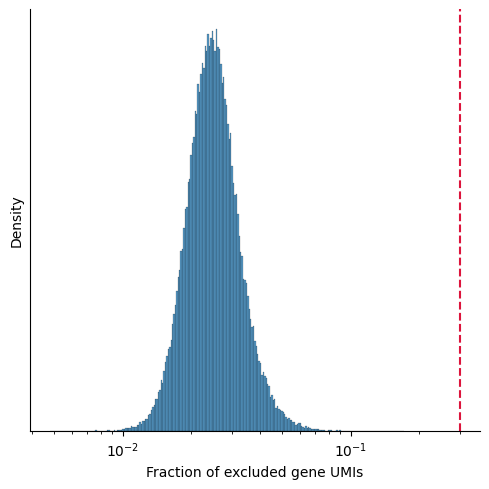

In [22]:
excluded_umis_fraction_regularization = 1e-3  # Avoid 0 values in log scale plot.
excluded_umis_per_cell = mc.ut.get_o_numpy(full, "excluded_umis")
excluded_umis_fraction_per_cell = excluded_umis_per_cell / total_umis_per_cell

excluded_umis_fraction_per_cell += excluded_umis_fraction_regularization
plot = sb.displot(excluded_umis_fraction_per_cell, log_scale=(10, None))
excluded_umis_fraction_per_cell -= excluded_umis_fraction_regularization

plot.set(xlabel="Fraction of excluded gene UMIs", ylabel="Density", yticks=[])
plot.refline(x=PROPERLY_SAMPLED_MAX_EXCLUDED_GENES_FRACTION, color="crimson")

too_excluded_cells_count = np.sum(
    excluded_umis_fraction_per_cell > PROPERLY_SAMPLED_MAX_EXCLUDED_GENES_FRACTION
)
too_excluded_cells_fraction = too_excluded_cells_count / len(total_umis_per_cell)

print(
    f"Will exclude {too_excluded_cells_count} ({100 * too_excluded_cells_fraction:.2f}%) cells"
    f" with more than {100 * PROPERLY_SAMPLED_MAX_EXCLUDED_GENES_FRACTION:.2f}% excluded gene UMIs"
)

In [23]:
## again do not exclude any cells

In [24]:
mc.pl.exclude_cells(
    full,
    properly_sampled_min_cell_total=PROPERLY_SAMPLED_MIN_CELL_TOTAL,
    properly_sampled_max_cell_total=PROPERLY_SAMPLED_MAX_CELL_TOTAL,
    properly_sampled_max_excluded_genes_fraction=PROPERLY_SAMPLED_MAX_EXCLUDED_GENES_FRACTION,
)

set chimp_mtg_full.obs[properly_sampled_cell]: 109096 true (100%) out of 109096 bools
set chimp_mtg_full.obs[excluded_cell]: 0 true (0%) out of 109096 bools


In [25]:
full.var

,name,bursty_lonely_gene,properly_sampled_gene,excluded_gene
5S-rRNA,5S-rRNA,False,True,False
5-8S-rRNA,5-8S-rRNA,False,True,False
7SK,7SK,False,False,True
A1BG,A1BG,False,True,False
A1BG-AS1,A1BG-AS1,False,True,False
...,...,...,...,...
snoZ40,snoZ40,False,False,True
snoZ6,snoZ6,False,False,True
snosnR66,snosnR66,False,False,True
uc-338,uc-338,False,False,True


In [26]:
clean = mc.pl.extract_clean_data(full, name="chimp_mtg_clean")
mc.ut.top_level(clean)
print(f"Clean: {clean.n_obs} cells, {clean.n_vars} genes")

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
set chimp_mtg_clean.obs[full_cell_index]: 109096 int32s
set chimp_mtg_clean.var[full_gene_index]: 40650 int32s


Clean: 109096 cells, 40650 genes


In [27]:
full.write_h5ad("chimp_full.h5ad")

In [28]:
clean.write_h5ad("chimp_clean.h5ad")

In [29]:
BASE_LATERAL_GENE_NAMES = [
    "AURKA", "MCM3", "MCM4", "MCM7", "MKI67", "PCNA", "RRM2", "SMC4", "TPX2",  # Cell-cycle
    "FOS", "HSP90AB1", "TXN",                                                  # Stress
]
BASE_LATERAL_GENE_PATTERNS = ["RP[LS].*"]  # Ribosomal

In [30]:
cells = clean
clean = None  # Allow it to be gc-ed
mc.ut.set_name(cells, "chimp_mtg_iteration1")
print(f"Iteration 1: {cells.n_obs} cells, {cells.n_vars} genes")

Iteration 1: 109096 cells, 40650 genes


In [31]:
# We'll reuse this through the iterations.
# It is just a thin wrapper for mark_lateral_genes,
# and optionally also shows the results.
def update_lateral_genes(
    *,
    names: List[str] = [],
    patterns: List[str] = [],
    op: str = "set",
    show: bool = True
) -> None:
    mc.pl.mark_lateral_genes(
        cells,
        lateral_gene_names=names,
        lateral_gene_patterns=patterns,
        op=op
    )

    if not show:
        return
    
    lateral_genes_mask = mc.ut.get_v_numpy(cells, "lateral_gene")
    lateral_gene_names = set(cells.var_names[lateral_genes_mask])
    
    print(sorted([
        name for name in lateral_gene_names
        if not name.startswith("RPL") and not name.startswith("RPS")
    ]))

    print(f"""and {len([
        name for name in lateral_gene_names if name.startswith("RPL") or name.startswith("RPS")
    ])} RP[LS].* genes""")

update_lateral_genes(names=BASE_LATERAL_GENE_NAMES, patterns=BASE_LATERAL_GENE_PATTERNS)

set chimp_mtg_iteration1.var[lateral_gene]: 762 true (1.875%) out of 40650 bools


['AURKA', 'FOS', 'HSP90AB1', 'MCM3', 'MCM4', 'MCM7', 'MKI67', 'PCNA', 'RRM2', 'SMC4', 'TPX2', 'TXN']
and 750 RP[LS].* genes


In [32]:
mc.pl.relate_to_lateral_genes(cells, random_seed=123456)

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
set chimp_mtg_iteration1.var[lateral_genes_module]: 31386 outliers (77.21%) and 9264 grouped (22.79%) out of 40650 int32 elements with 287 groups with mean size 32.28
set chimp_mtg_iteration1.varp[lateral_genes_similarity]: csr_matrix 40650 X 40650 float32s (85821696 > 0, 5.194%)


In [33]:
base_lateral_genes_mask = mc.ut.get_v_numpy(cells, "lateral_gene")
base_lateral_gene_names = set(cells.var_names[base_lateral_genes_mask])

module_per_gene = mc.ut.get_v_series(cells, "lateral_genes_module")
base_lateral_gene_modules = np.unique(module_per_gene.values[base_lateral_genes_mask])
base_lateral_gene_modules = set(base_lateral_gene_modules[base_lateral_gene_modules >= 0])

genes_per_module = np.unique(module_per_gene.values, return_counts=True)[1][1:]
similarity_of_modules = mc.ut.get_vv_proper(cells, "lateral_genes_similarity")
similarity_of_modules = mc.ut.sum_groups(similarity_of_modules, module_per_gene.values, per="row")[0]
similarity_of_modules = mc.ut.to_layout(similarity_of_modules, layout="column_major")
similarity_of_modules = \
    mc.ut.sum_groups(similarity_of_modules, module_per_gene.values, per="column")[0]
similarity_of_modules /= genes_per_module[:, np.newaxis] * genes_per_module[np.newaxis, :]

module_names = [
    f"(*) {gene_module}" if gene_module in base_lateral_gene_modules else str(gene_module)
    for gene_module in range(np.max(module_per_gene.values) + 1)
]
similarity_of_modules = pd.DataFrame(similarity_of_modules, index=module_names, columns=module_names)

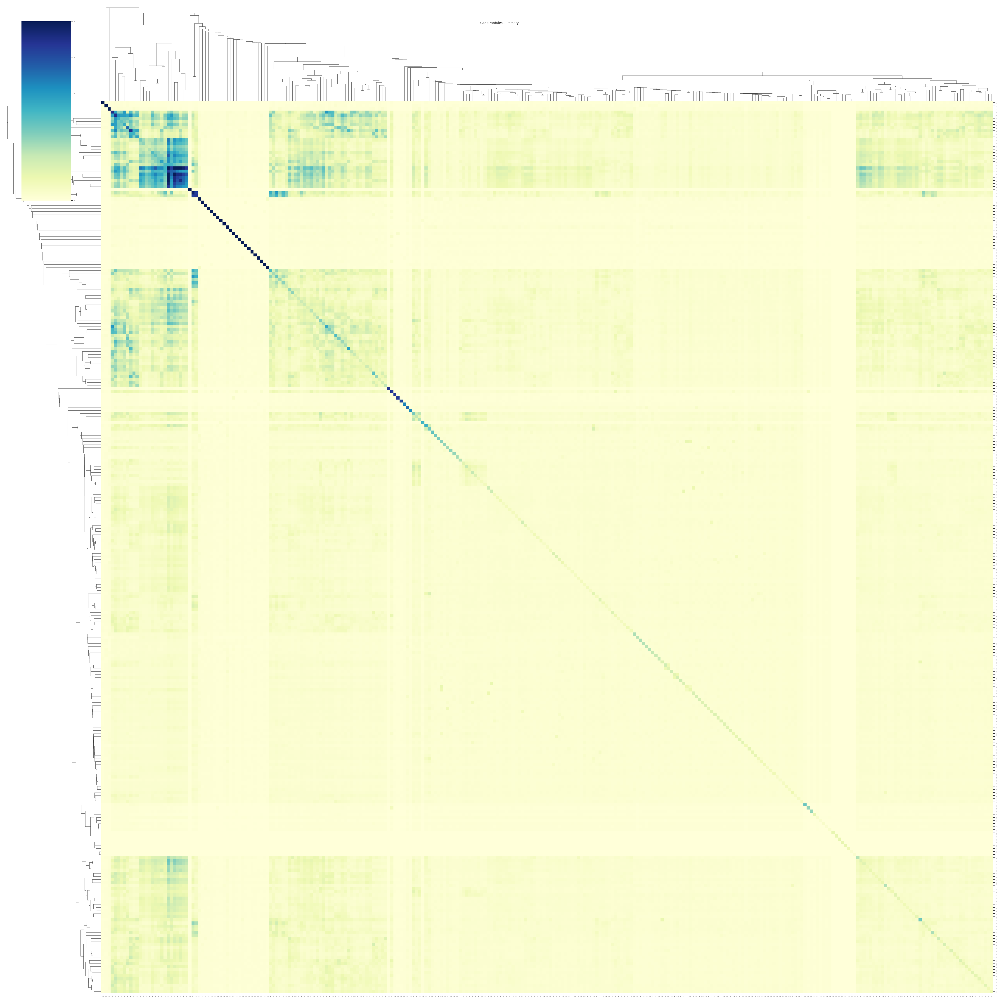

In [34]:
size = similarity_of_modules.shape[0]
if size > 50:
    sb.set(font_scale=50 / size)
size = size * 0.15 + 1
cm = sb.clustermap(
    similarity_of_modules,
    figsize=(size, size),
    vmin=0, vmax=0.5,
    xticklabels=True, yticklabels=True,
    dendrogram_ratio=0.1,
    cmap="YlGnBu",
)
cm.fig.suptitle("Gene Modules Summary", fontsize=10)

plt.show()

In [35]:
SHOW_CORRELATED_MODULES = 0.2 # Show non-lateral modules if correlated to lateral modules.
MIN_SIMILARITY_TO_SHOW = 0.2 # Show modules only if there's at least this correlation

base_lateral_gene_modules = np.unique(module_per_gene.values[base_lateral_genes_mask])
base_lateral_gene_modules = base_lateral_gene_modules[base_lateral_gene_modules >= 0]
similarity_of_genes = mc.ut.get_vv_frame(cells, "lateral_genes_similarity")

In [36]:
gene_module=1

In [37]:
module_per_gene[module_per_gene.values == gene_module].size

2

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/matrix.py:615: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(0, max_dependent_coord * 1.05)
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/matrix.py:623: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(0, max_dependent_coord * 1.05)


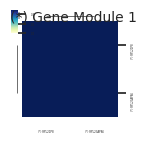

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/matrix.py:615: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(0, max_dependent_coord * 1.05)
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/matrix.py:623: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(0, max_dependent_coord * 1.05)


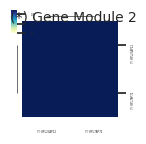

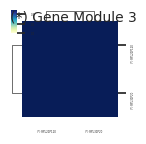

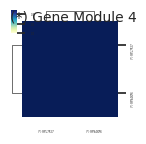

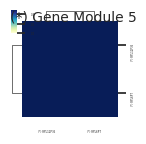

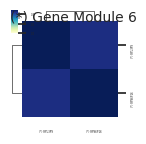

...

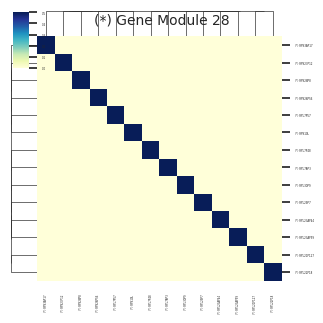

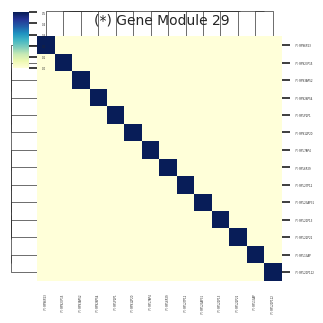

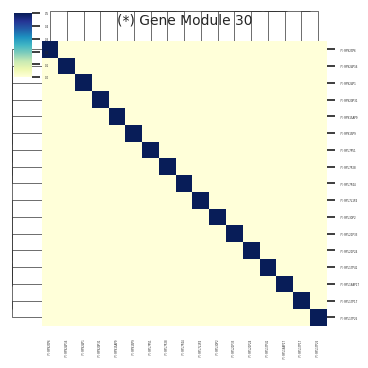

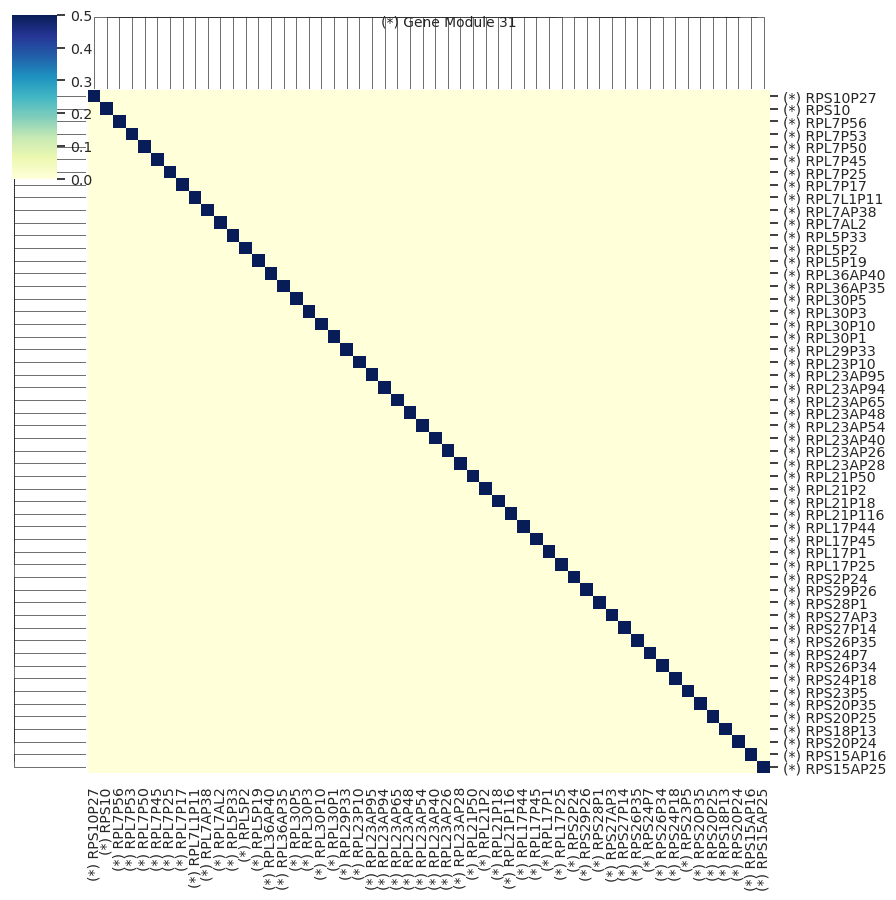

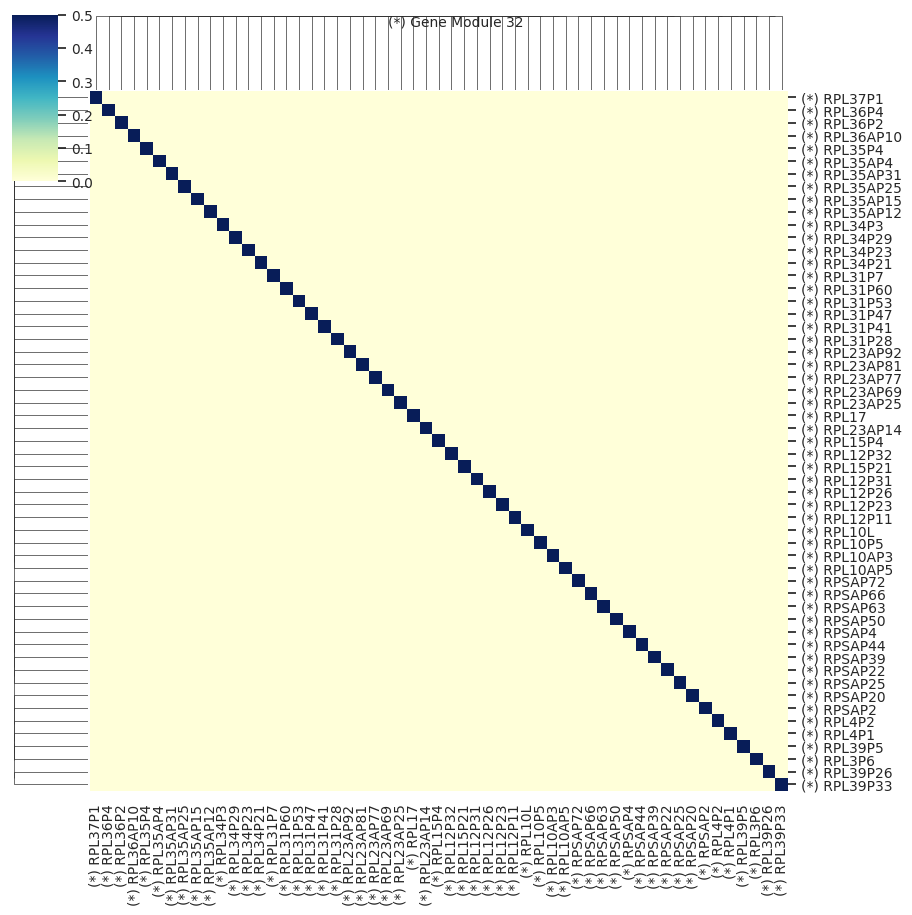

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/matrix.py:1113: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(**tight_params)


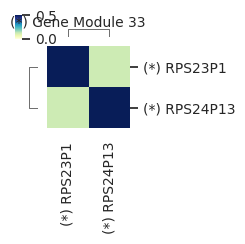

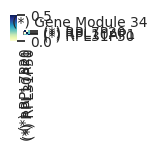

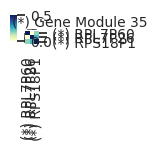

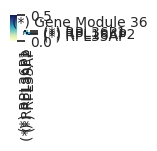

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/matrix.py:1113: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(**tight_params)


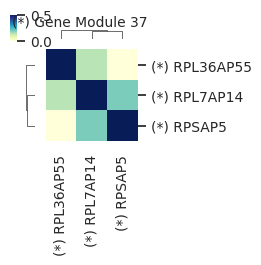

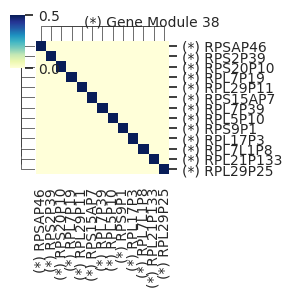

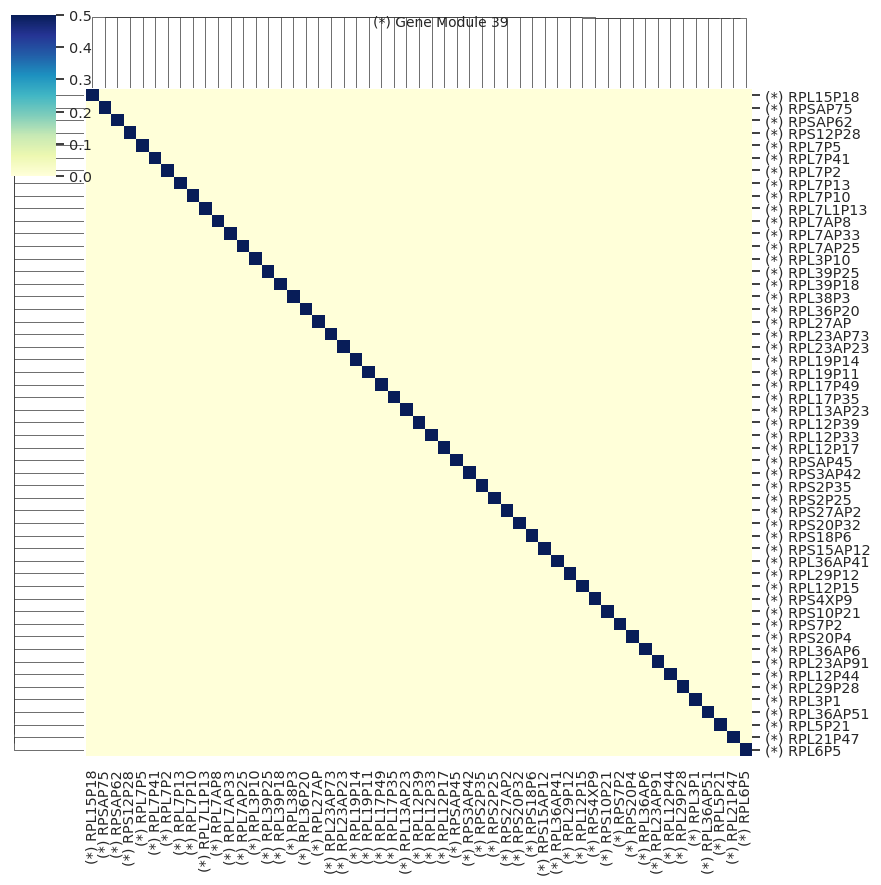

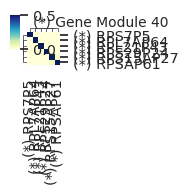

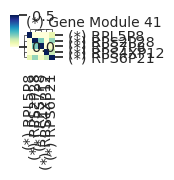

...

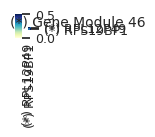

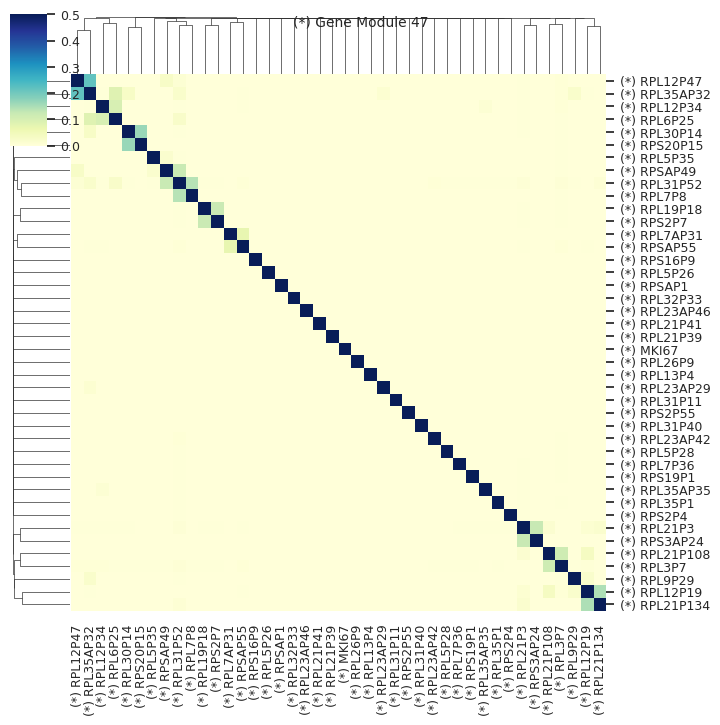

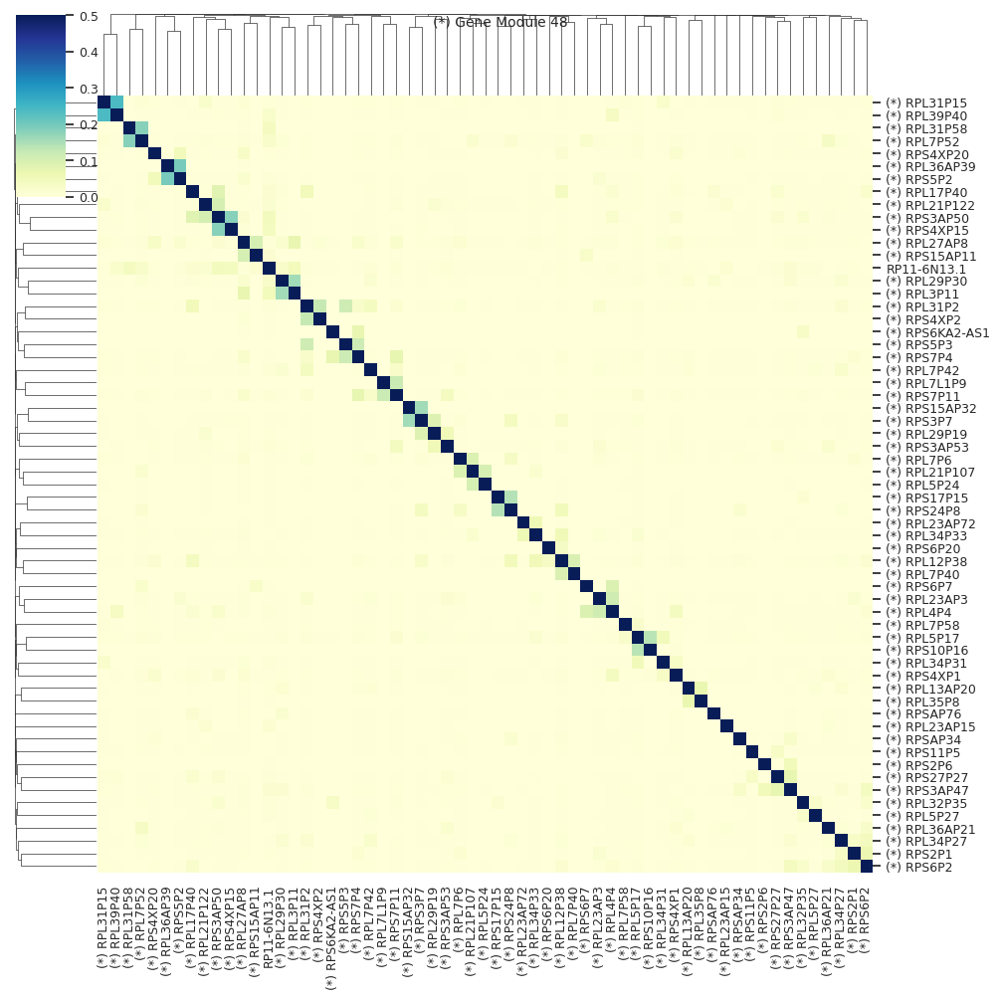

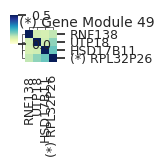

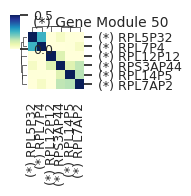

<Figure size 235x235 with 0 Axes>

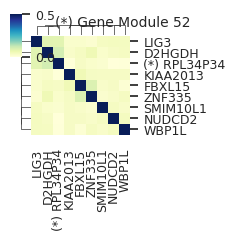

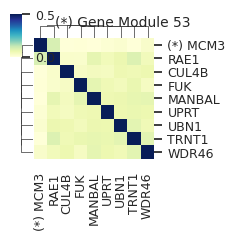

<Figure size 310x310 with 0 Axes>

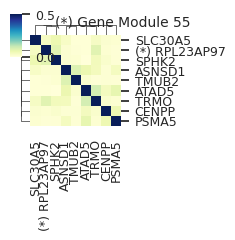

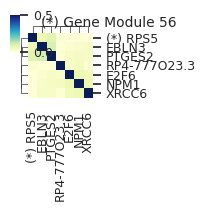

<Figure size 280x280 with 0 Axes>

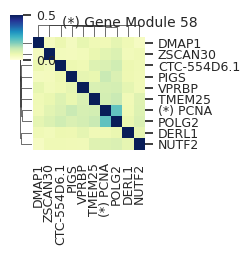

<Figure size 280x280 with 0 Axes>

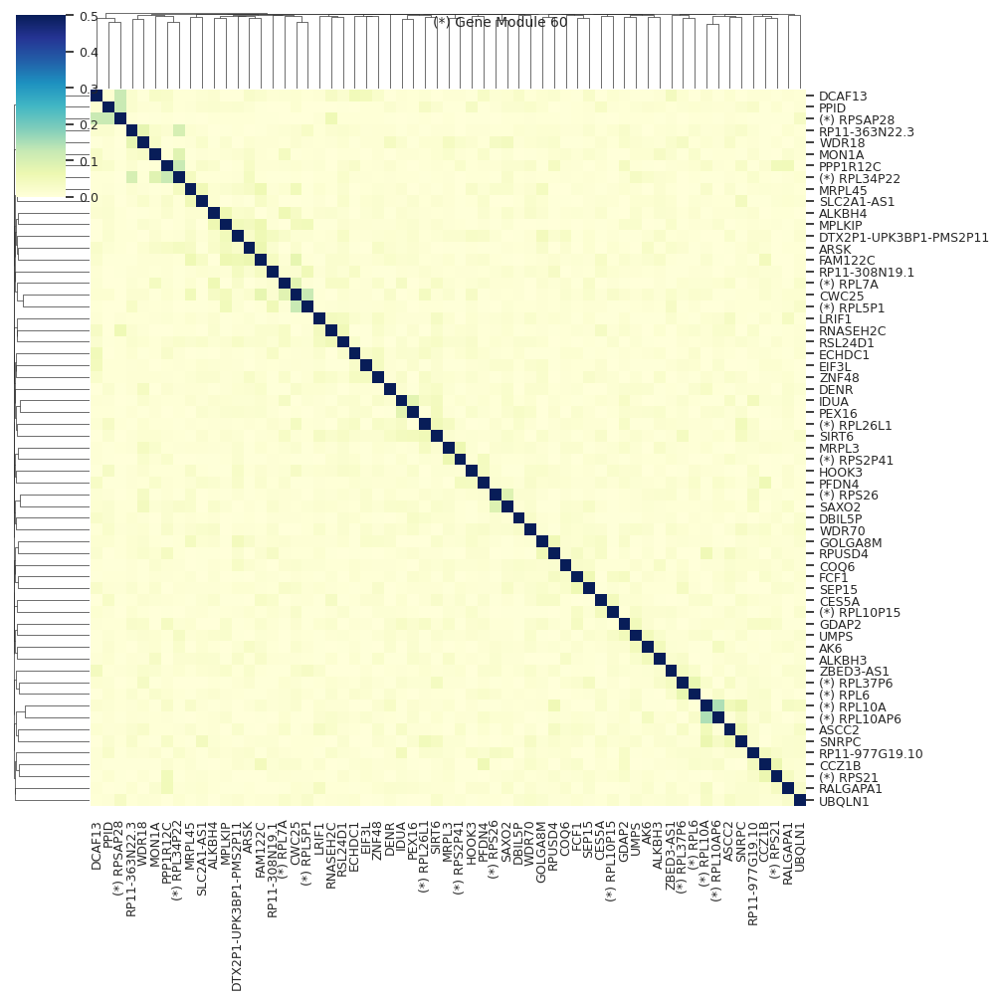

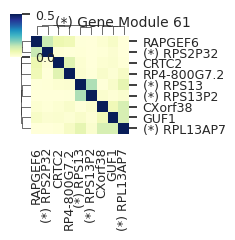

<Figure size 565x565 with 0 Axes>

<Figure size 190x190 with 0 Axes>

<Figure size 565x565 with 0 Axes>

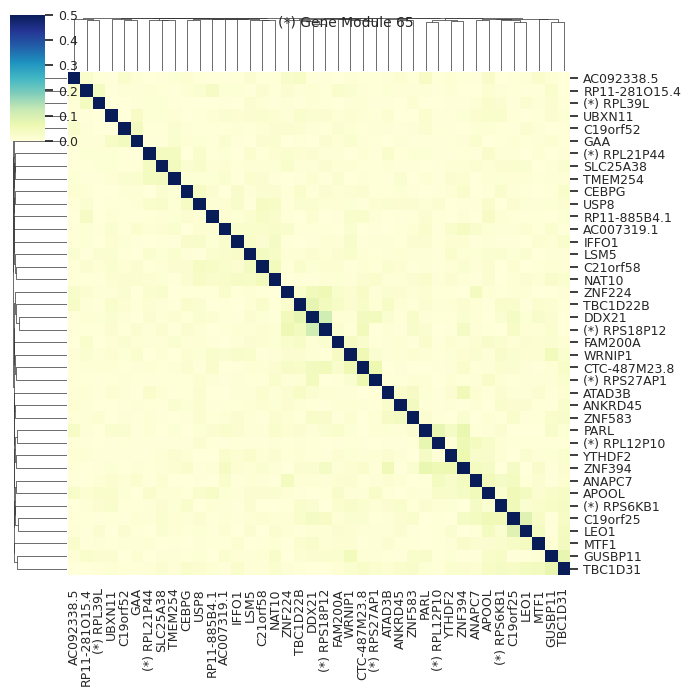

<Figure size 415x415 with 0 Axes>

<Figure size 355x355 with 0 Axes>

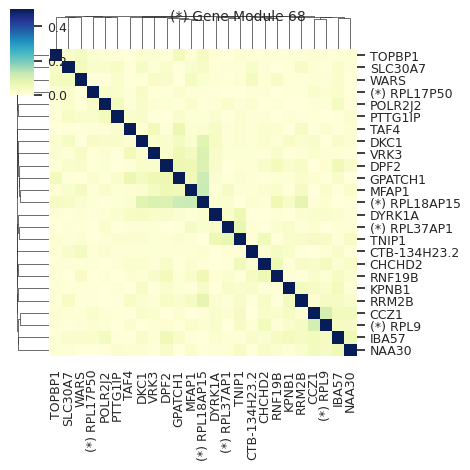

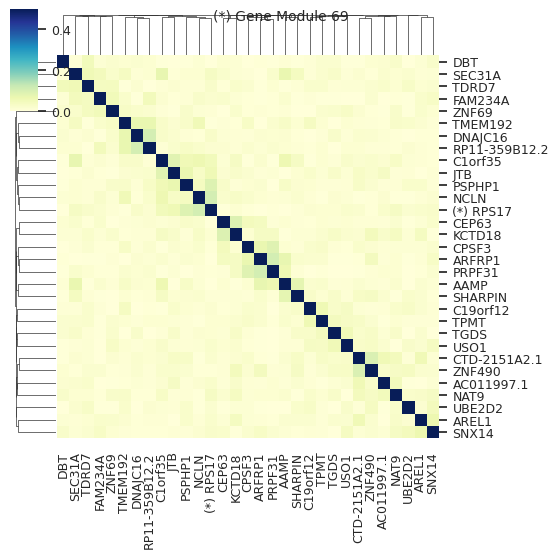

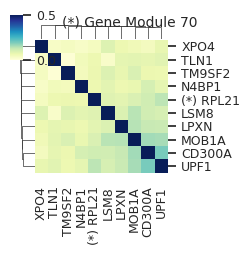

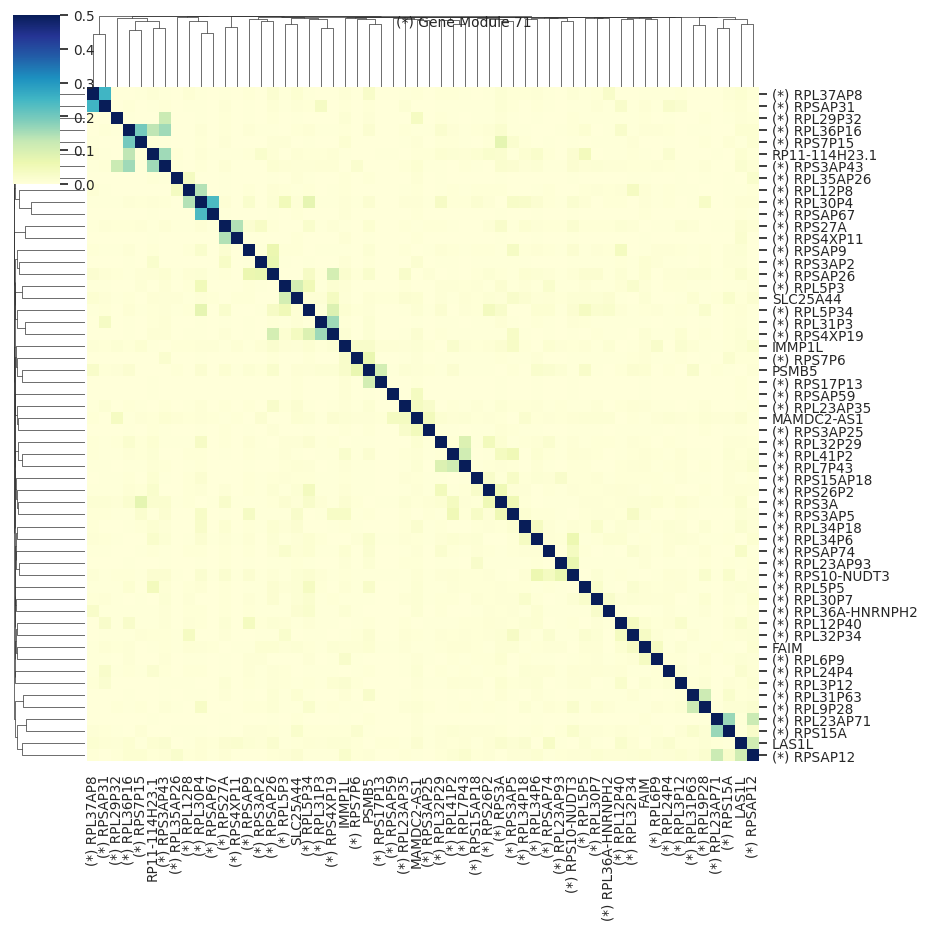

<Figure size 595x595 with 0 Axes>

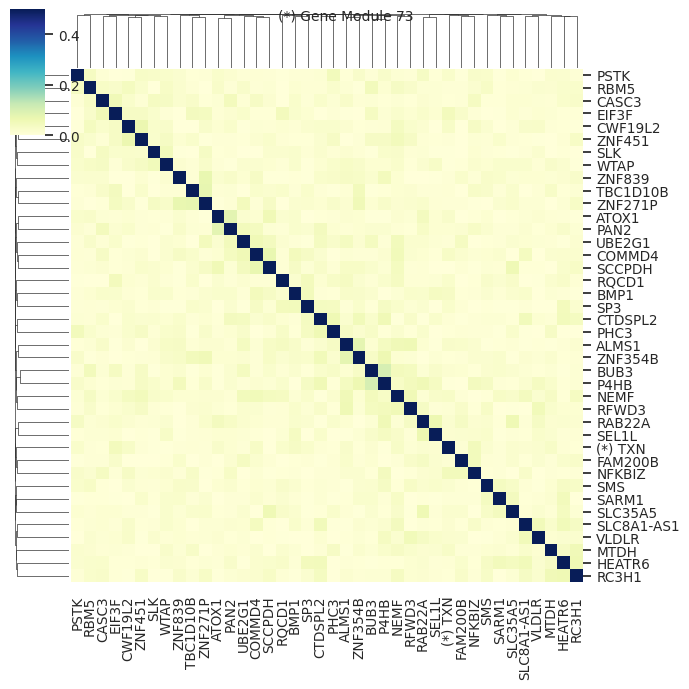

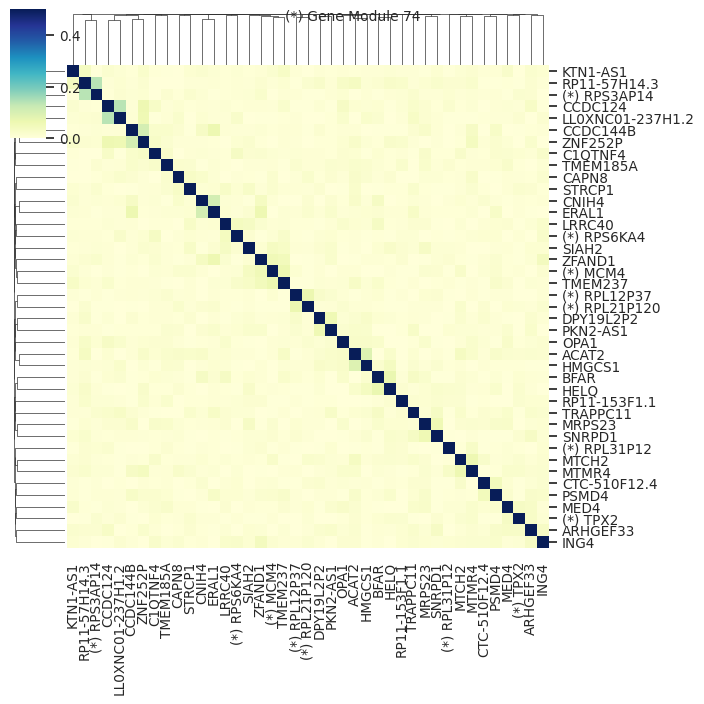

<Figure size 370x370 with 0 Axes>

<Figure size 430x430 with 0 Axes>

<Figure size 235x235 with 0 Axes>

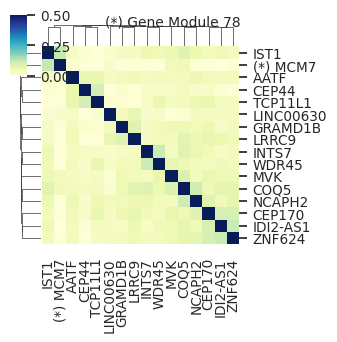

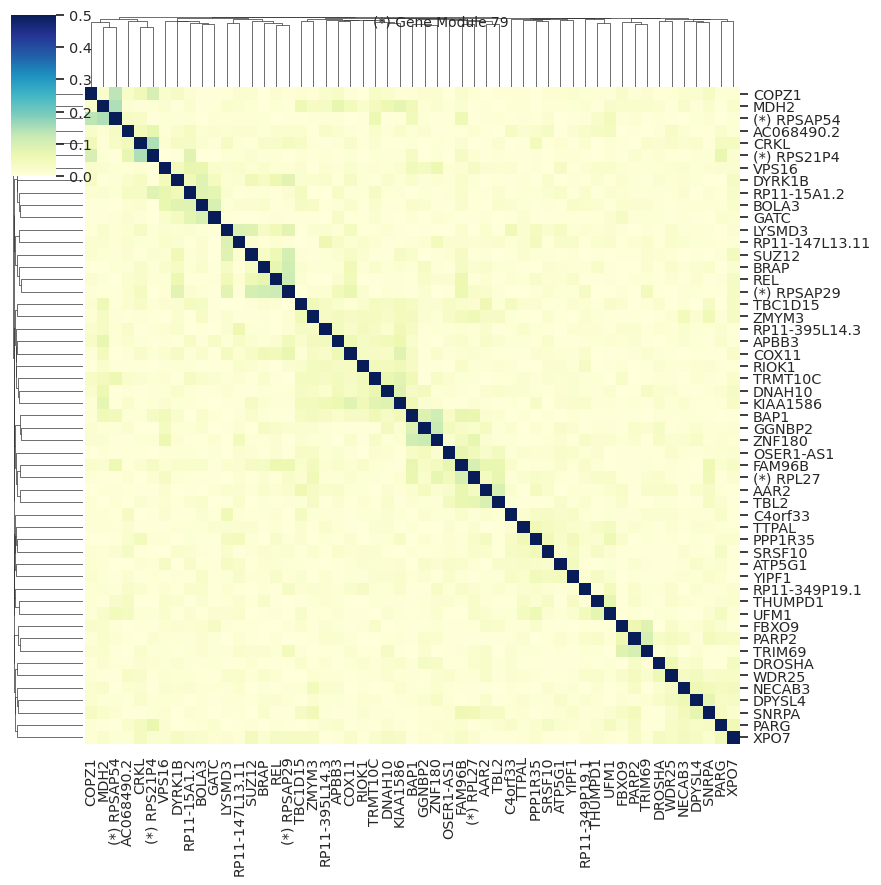

<Figure size 265x265 with 0 Axes>

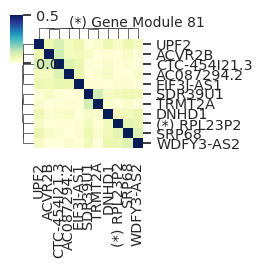

<Figure size 640x640 with 0 Axes>

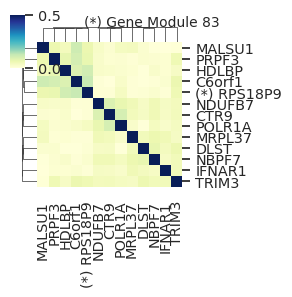

<Figure size 835x835 with 0 Axes>

<Figure size 655x655 with 0 Axes>

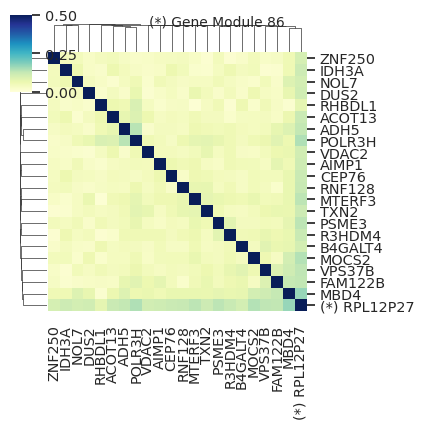

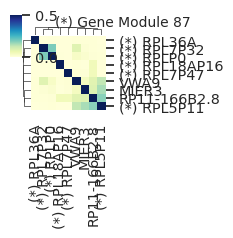

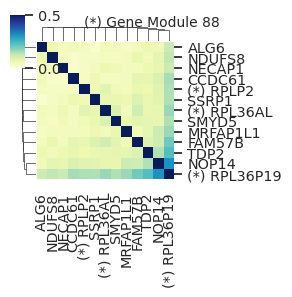

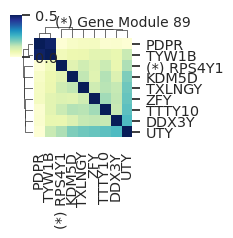

<Figure size 310x310 with 0 Axes>

<Figure size 700x700 with 0 Axes>

<Figure size 235x235 with 0 Axes>

<Figure size 370x370 with 0 Axes>

<Figure size 655x655 with 0 Axes>

<Figure size 445x445 with 0 Axes>

<Figure size 655x655 with 0 Axes>

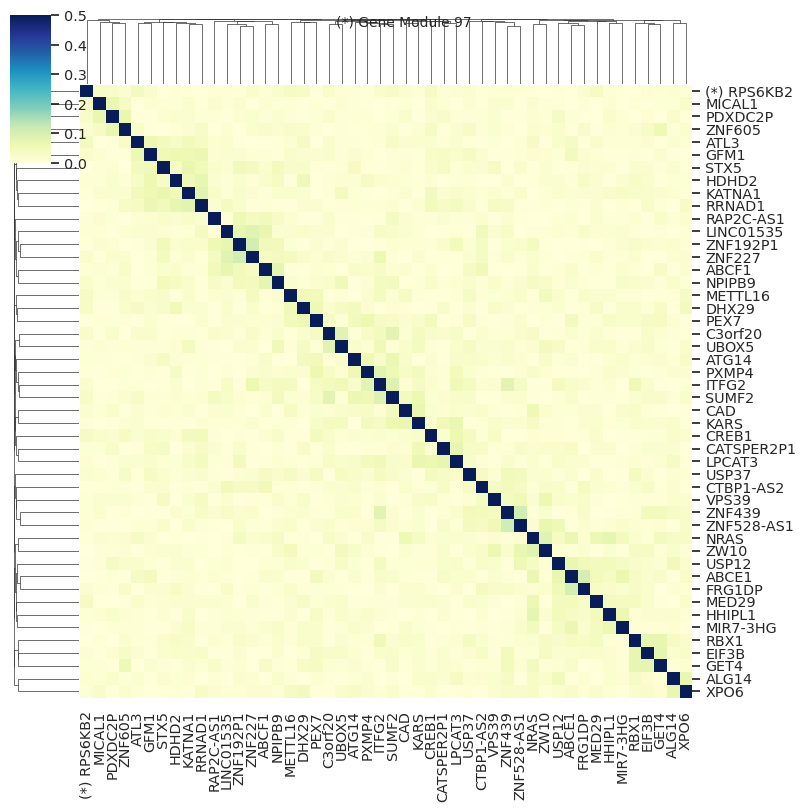

<Figure size 325x325 with 0 Axes>

<Figure size 925x925 with 0 Axes>

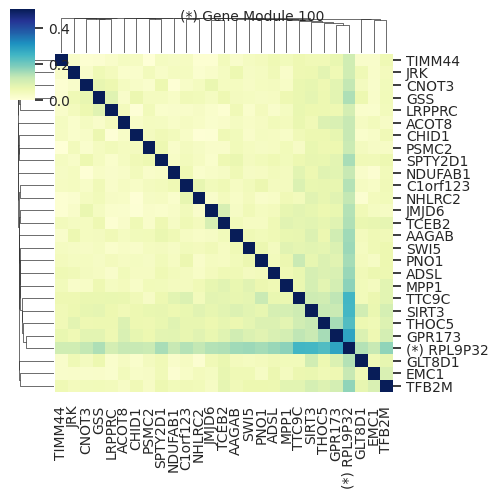

<Figure size 385x385 with 0 Axes>

<Figure size 715x715 with 0 Axes>

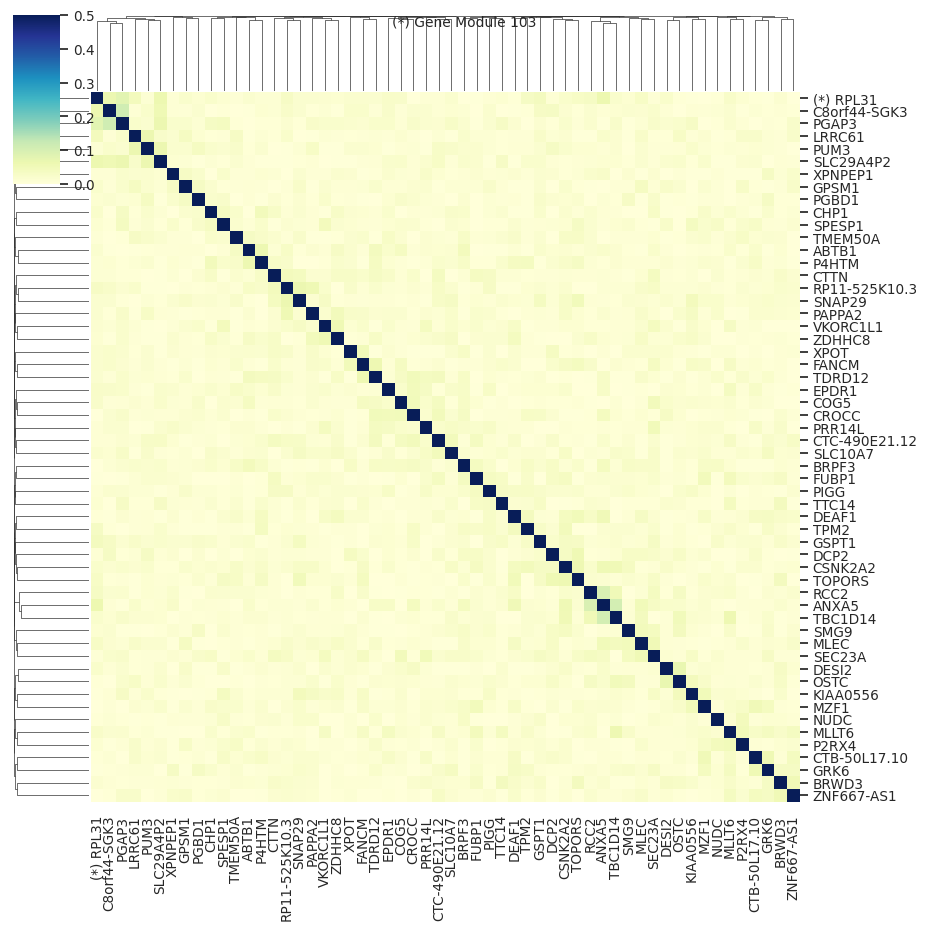

<Figure size 745x745 with 0 Axes>

<Figure size 685x685 with 0 Axes>

<Figure size 865x865 with 0 Axes>

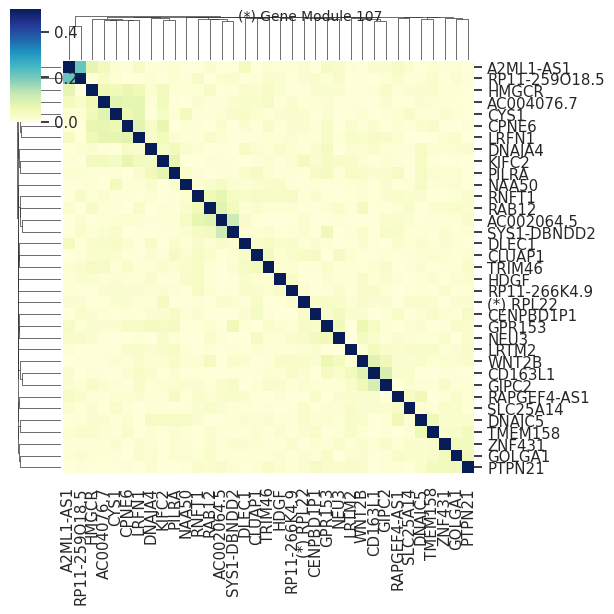

<Figure size 775x775 with 0 Axes>

<Figure size 355x355 with 0 Axes>

<Figure size 700x700 with 0 Axes>

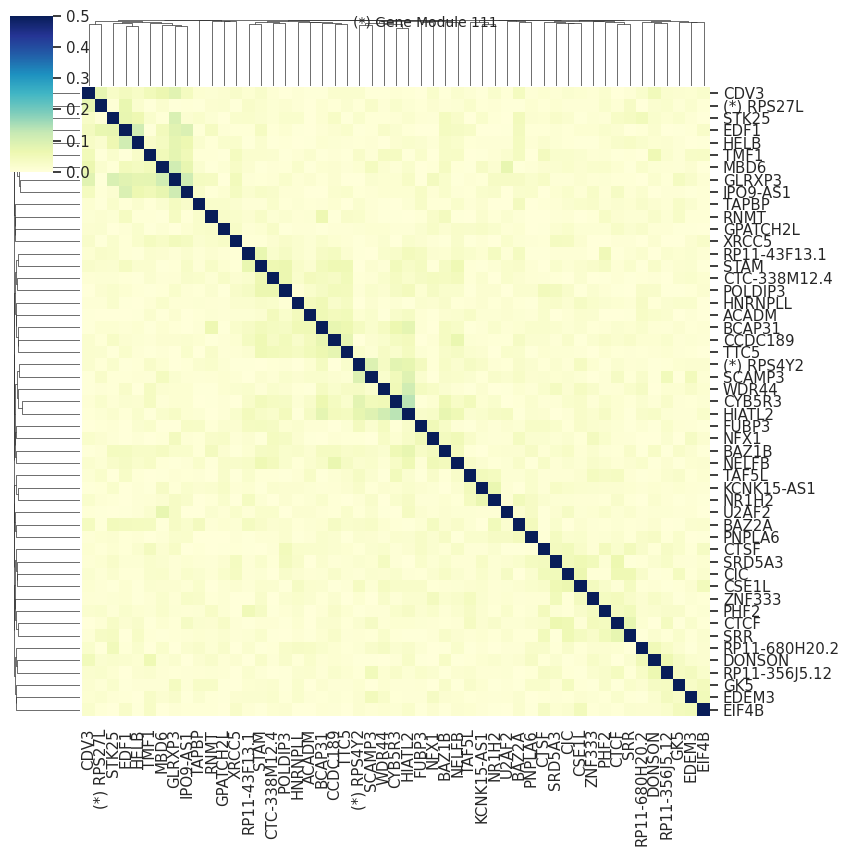

<Figure size 325x325 with 0 Axes>

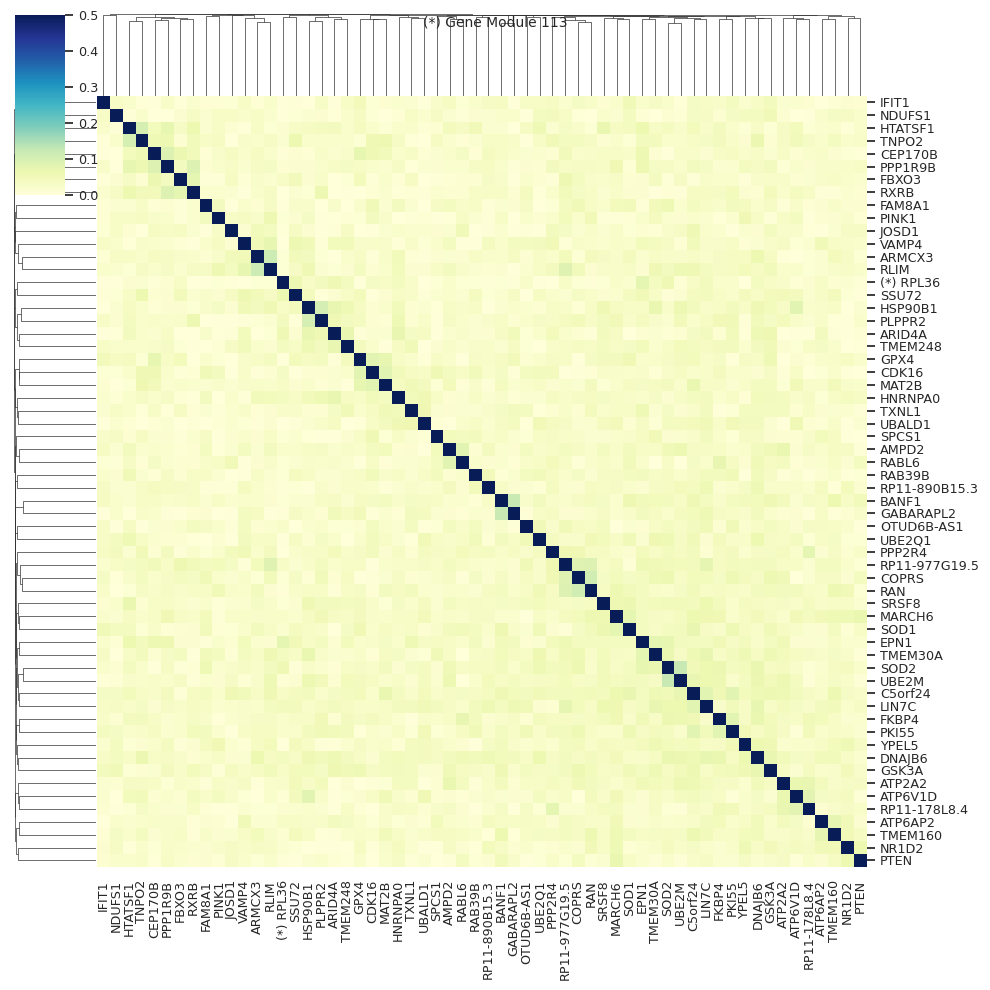

<Figure size 400x400 with 0 Axes>

<Figure size 790x790 with 0 Axes>

<Figure size 445x445 with 0 Axes>

<Figure size 940x940 with 0 Axes>

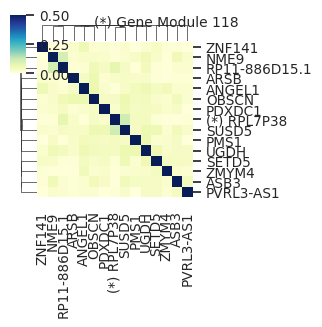

<Figure size 340x340 with 0 Axes>

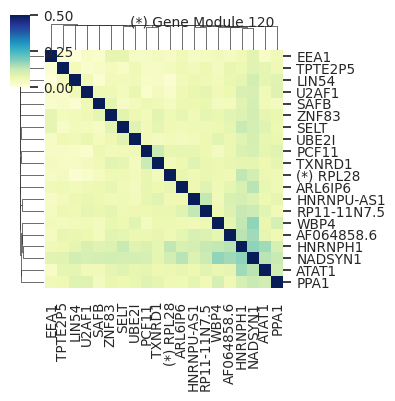

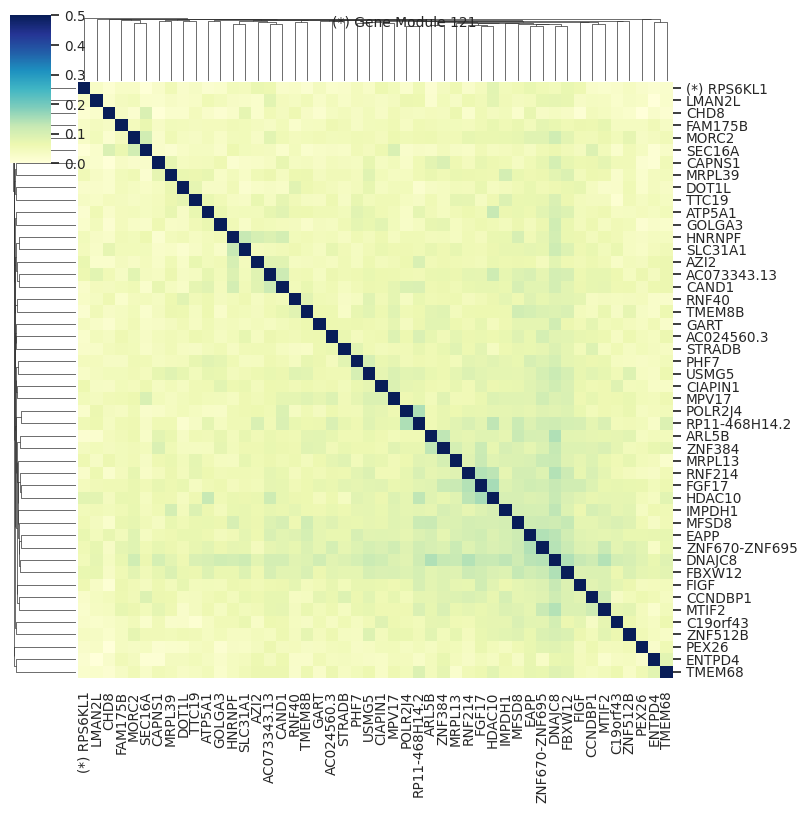

<Figure size 445x445 with 0 Axes>

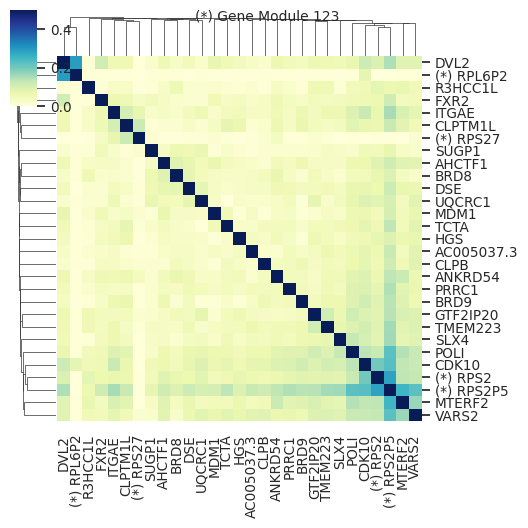

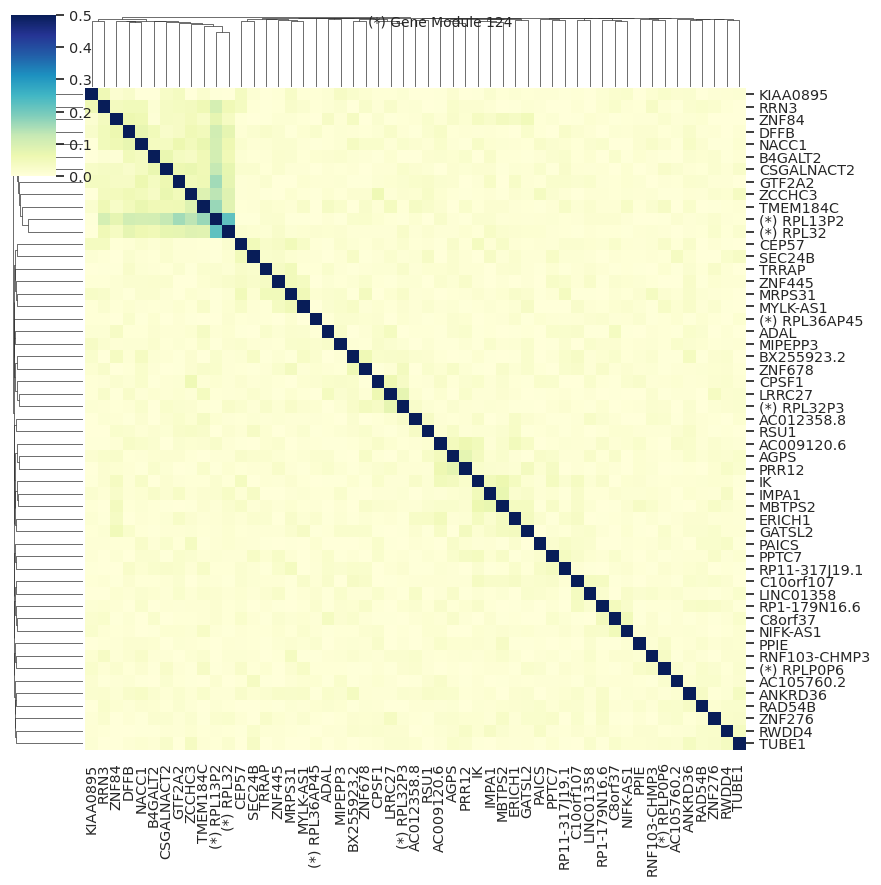

<Figure size 550x550 with 0 Axes>

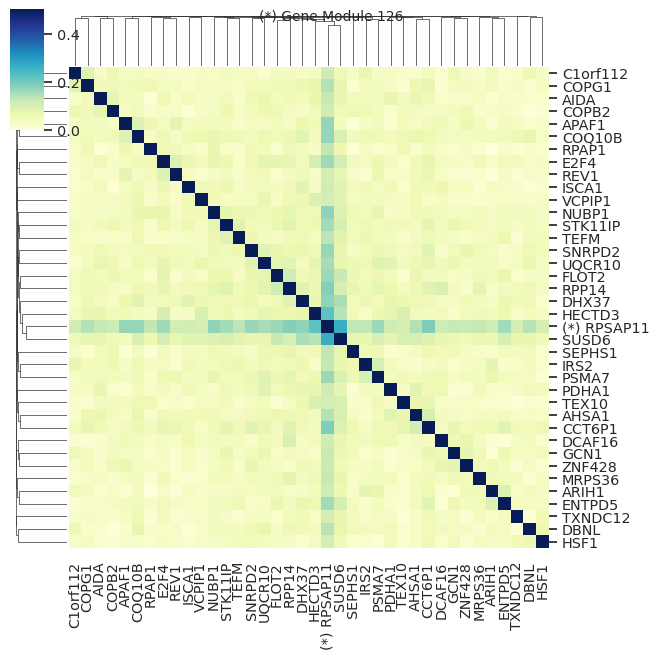

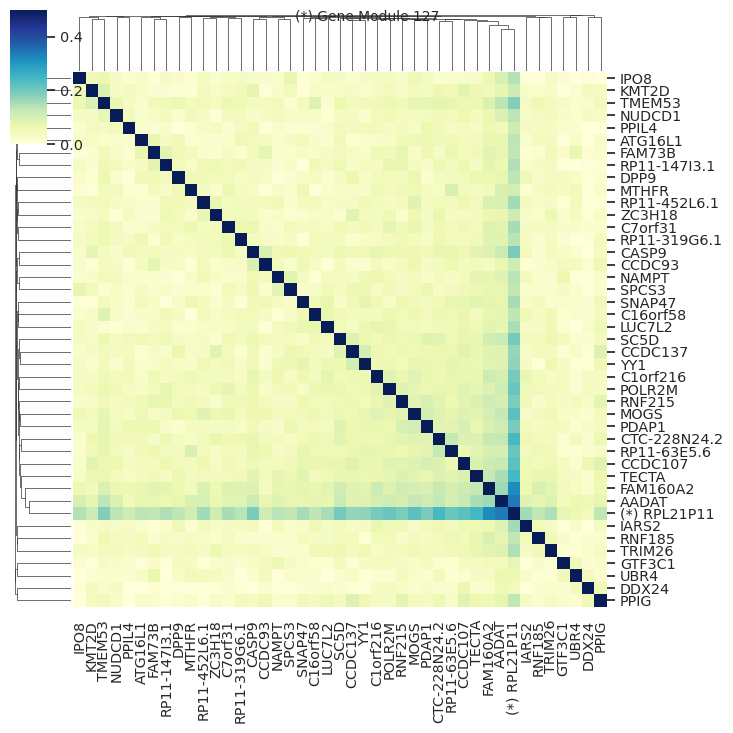

<Figure size 580x580 with 0 Axes>

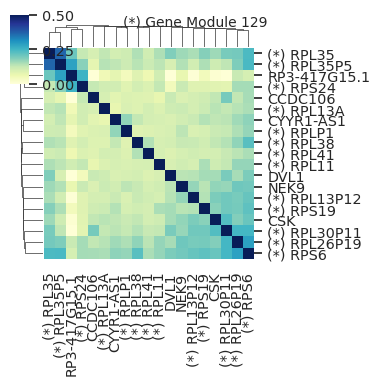

<Figure size 715x715 with 0 Axes>

<Figure size 610x610 with 0 Axes>

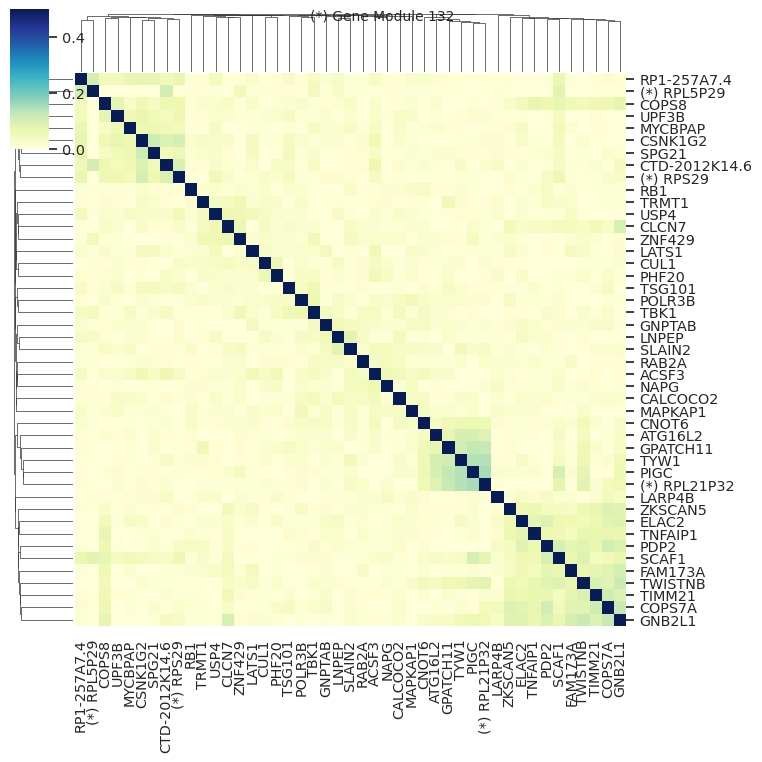

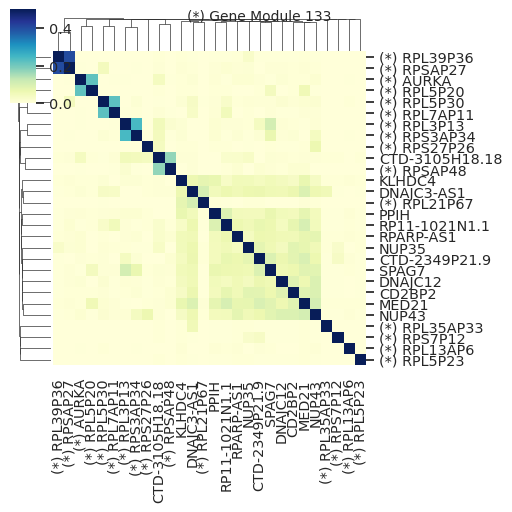

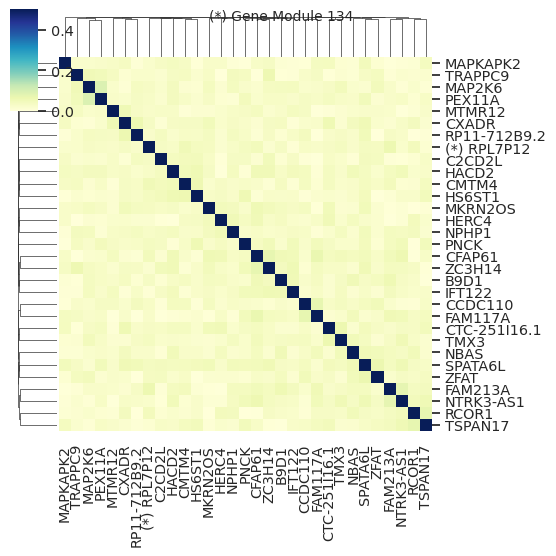

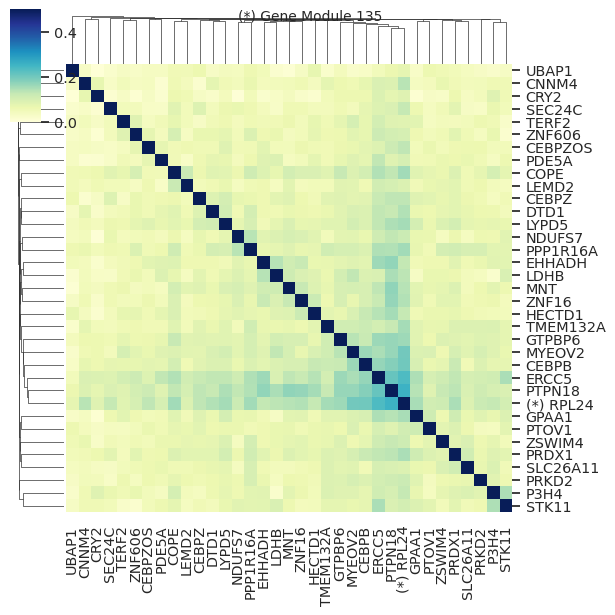

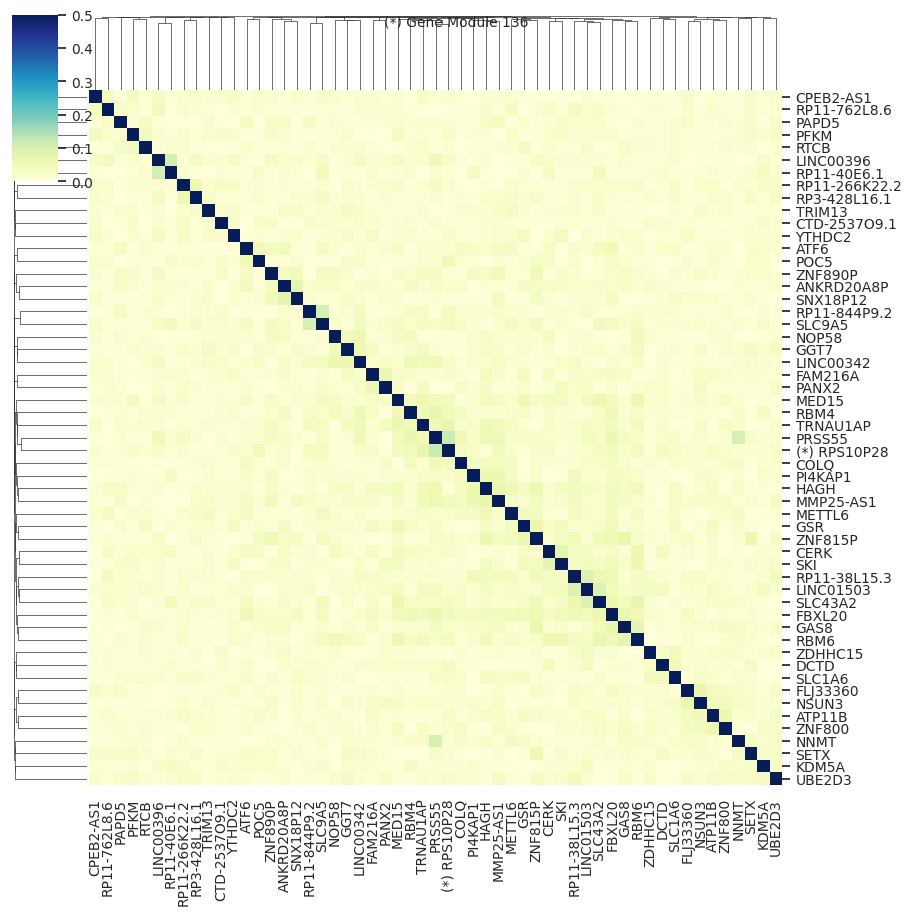

...

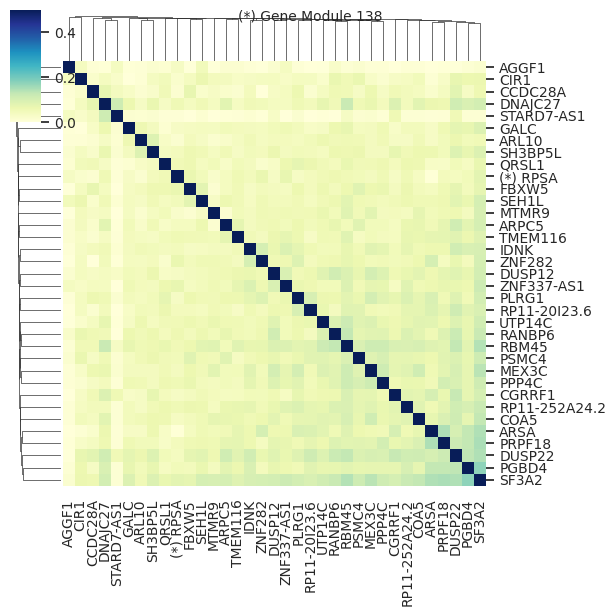

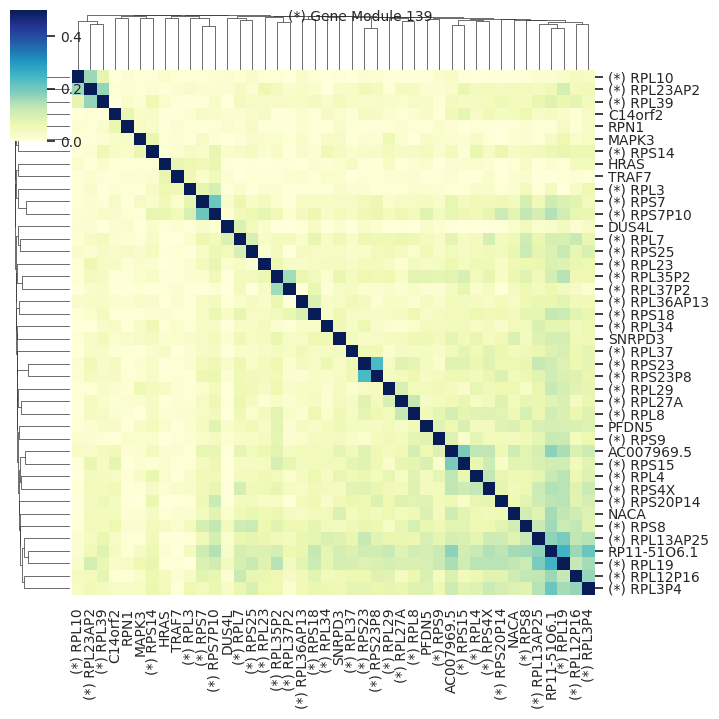

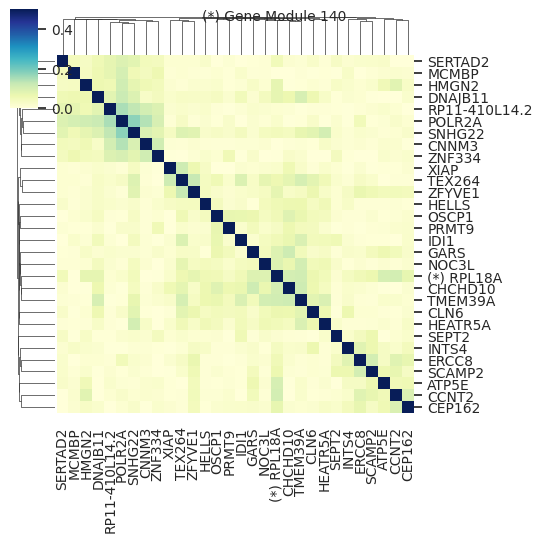

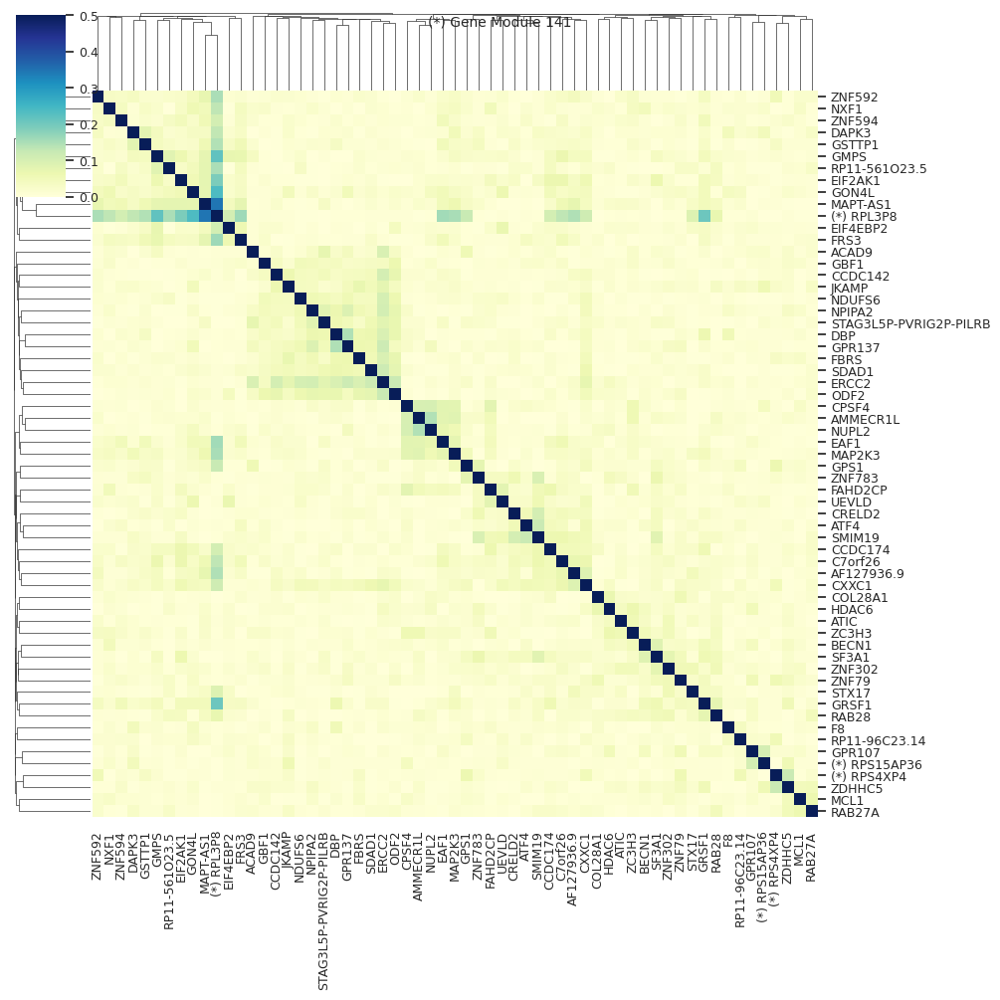

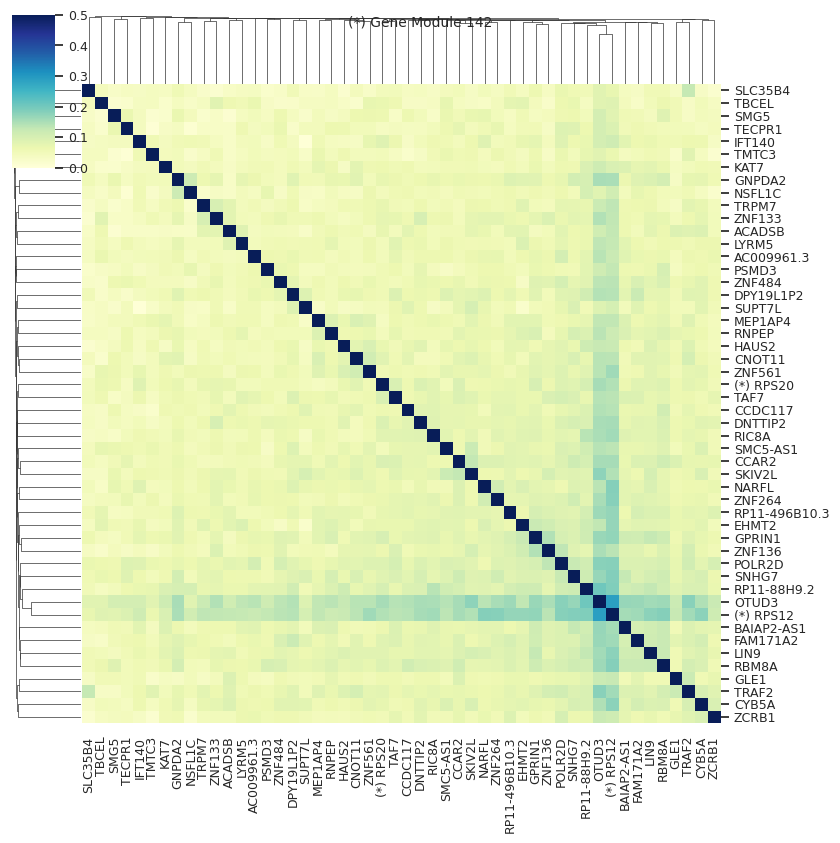

<Figure size 820x820 with 0 Axes>

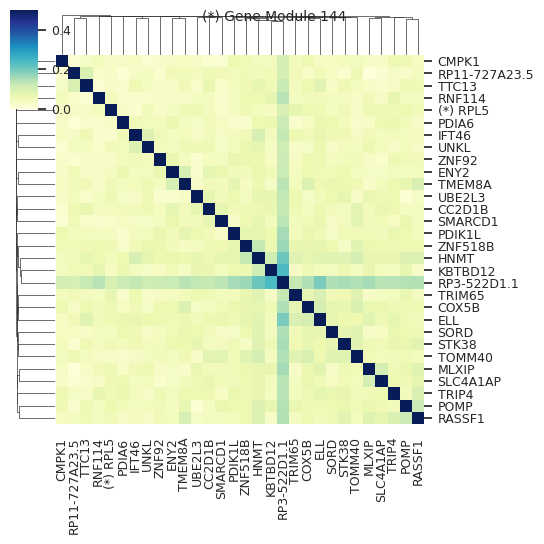

<Figure size 430x430 with 0 Axes>

<Figure size 970x970 with 0 Axes>

<Figure size 580x580 with 0 Axes>

<Figure size 640x640 with 0 Axes>

<Figure size 610x610 with 0 Axes>

<Figure size 610x610 with 0 Axes>

<Figure size 595x595 with 0 Axes>

<Figure size 520x520 with 0 Axes>

<Figure size 415x415 with 0 Axes>

<Figure size 535x535 with 0 Axes>

<Figure size 460x460 with 0 Axes>

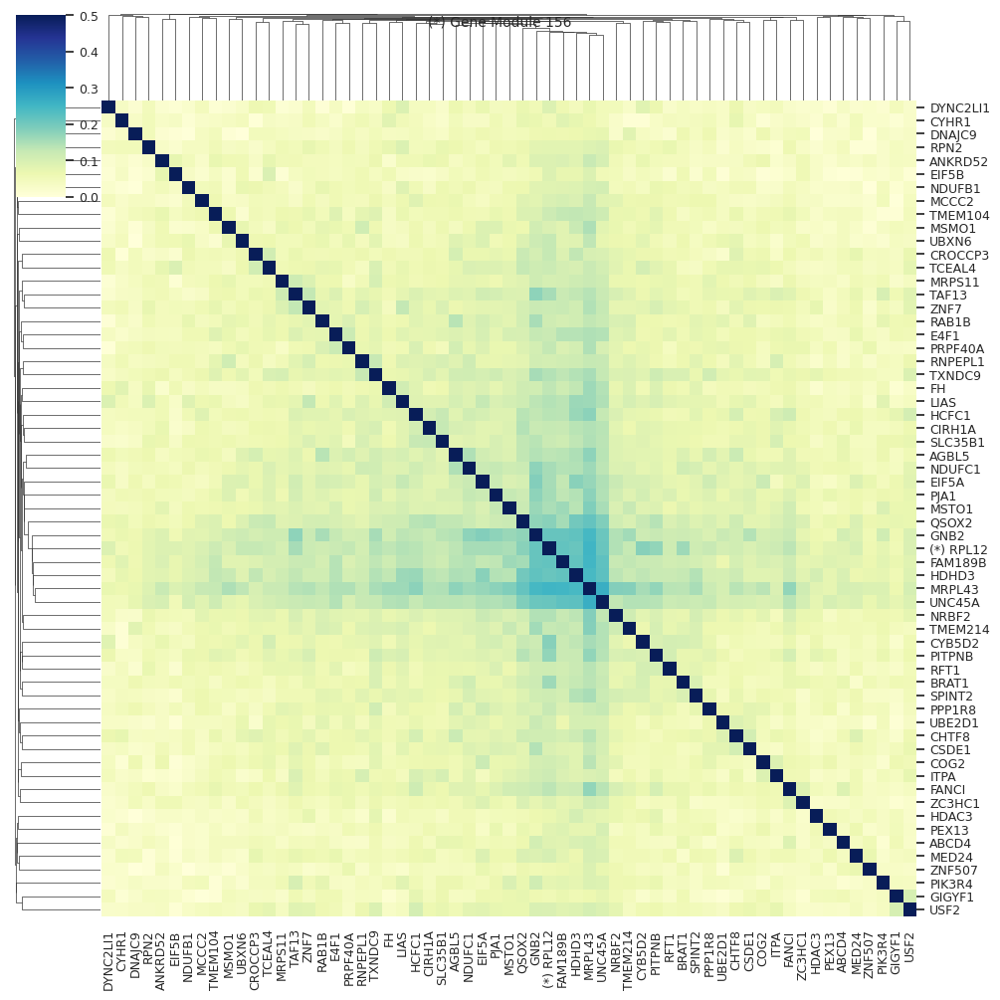

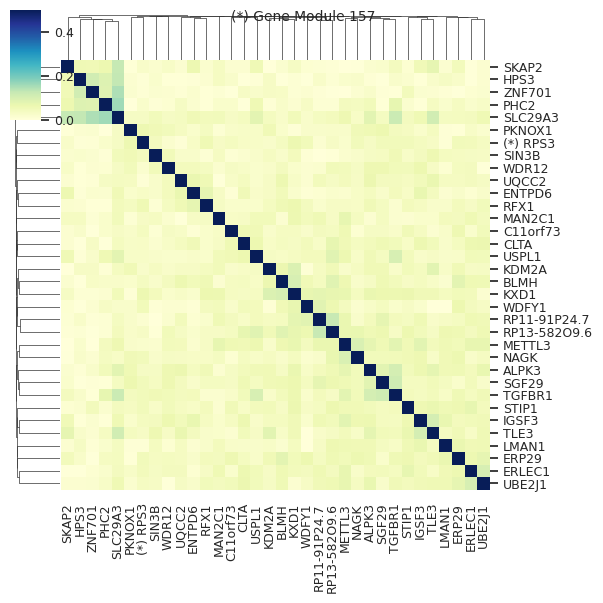

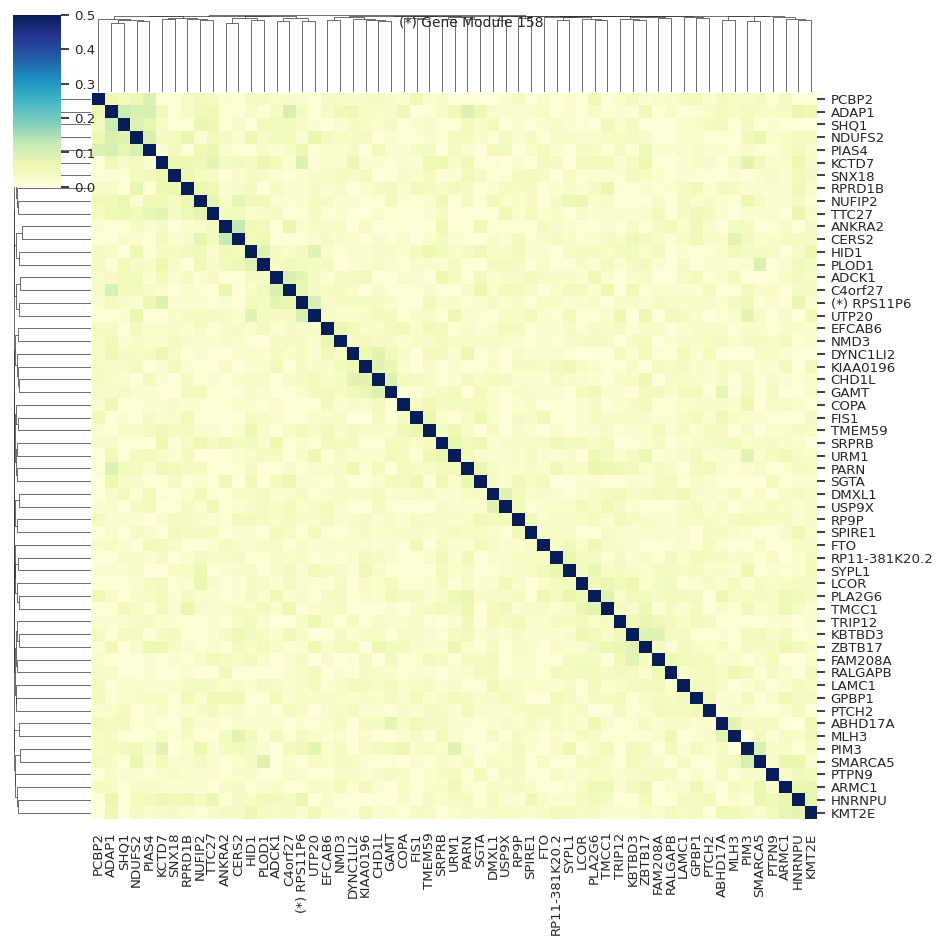

<Figure size 550x550 with 0 Axes>

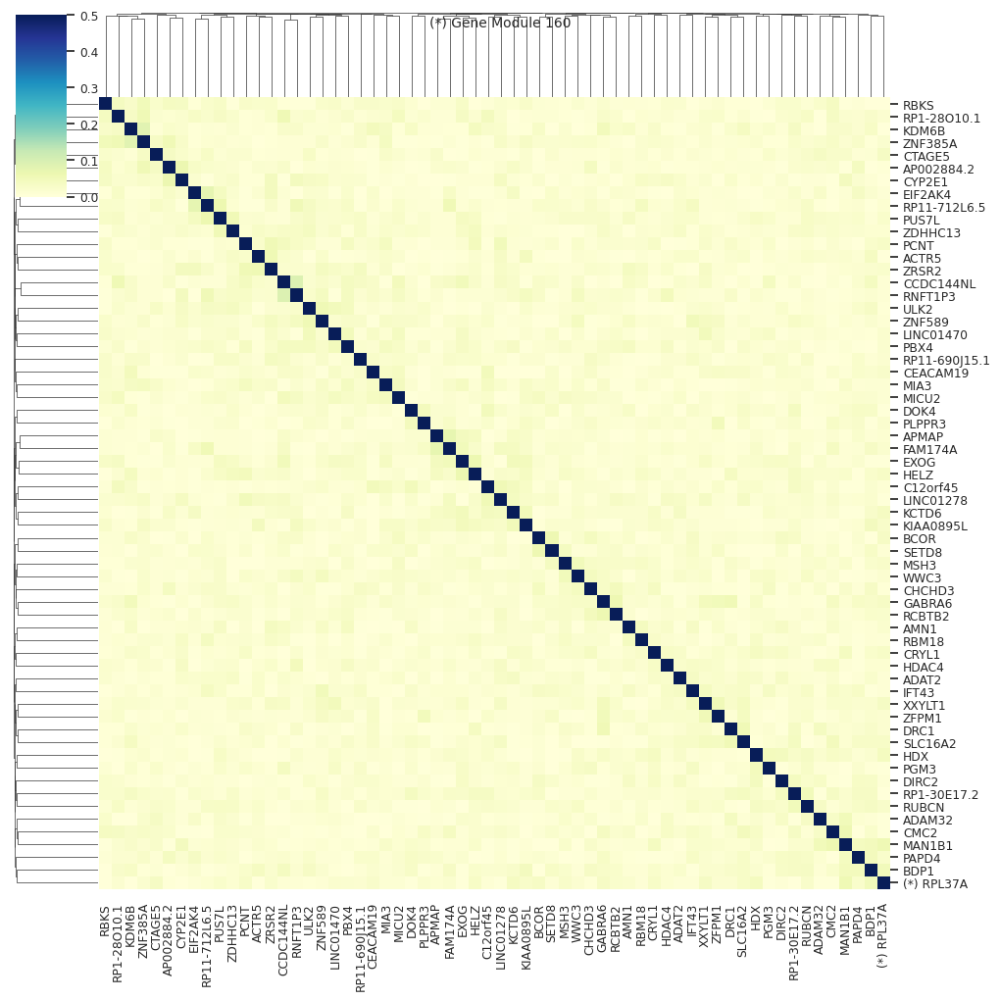

<Figure size 820x820 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

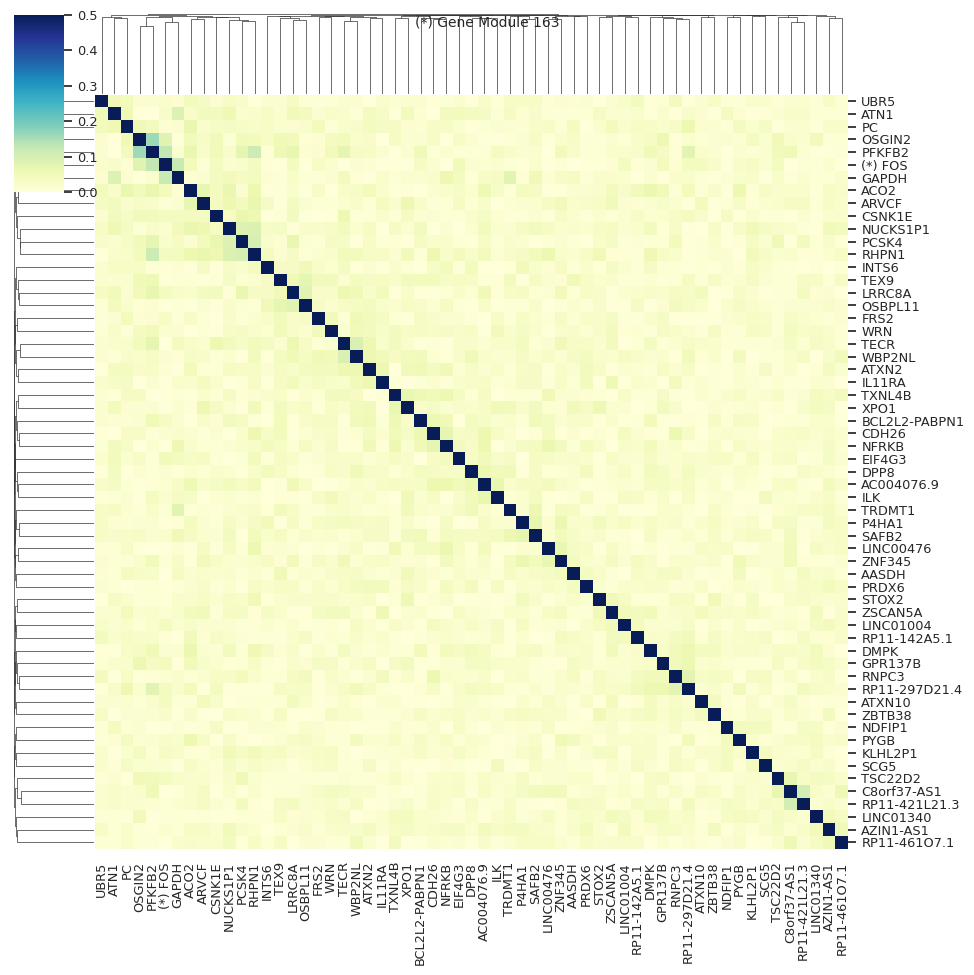

<Figure size 640x640 with 0 Axes>

<Figure size 280x280 with 0 Axes>

<Figure size 880x880 with 0 Axes>

<Figure size 760x760 with 0 Axes>

<Figure size 940x940 with 0 Axes>

<Figure size 190x190 with 0 Axes>

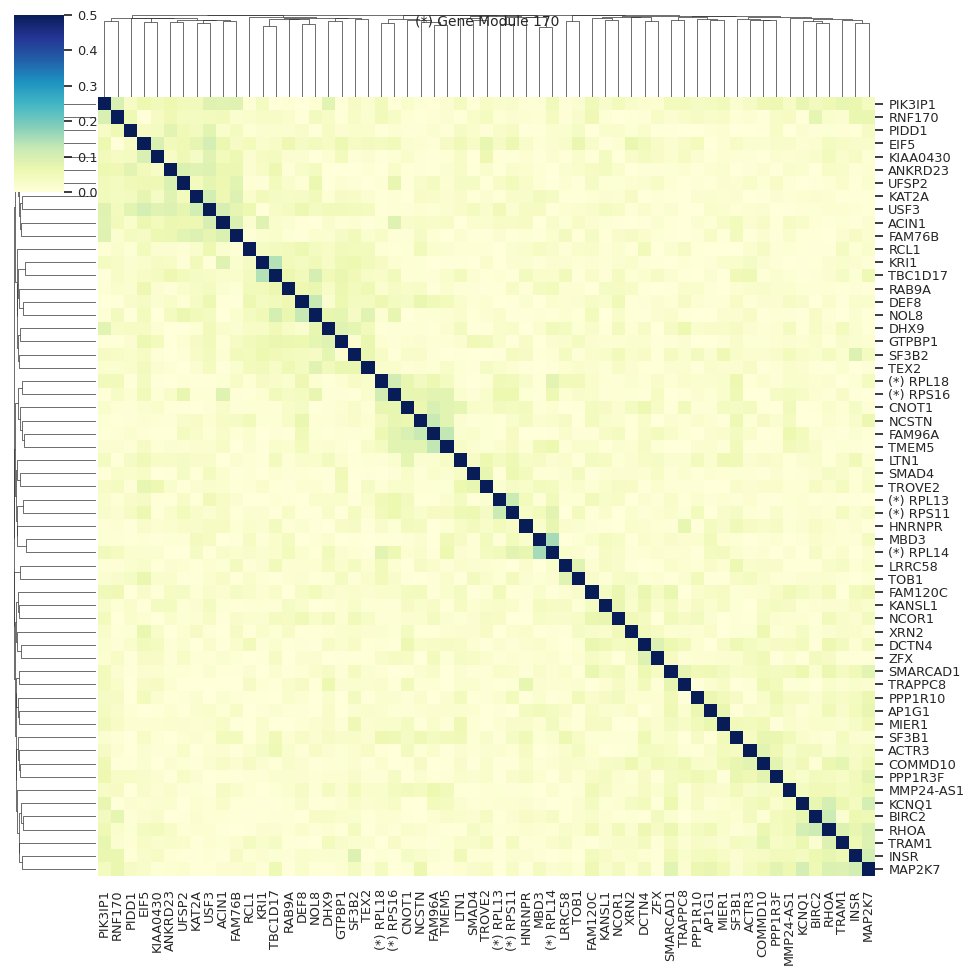

<Figure size 820x820 with 0 Axes>

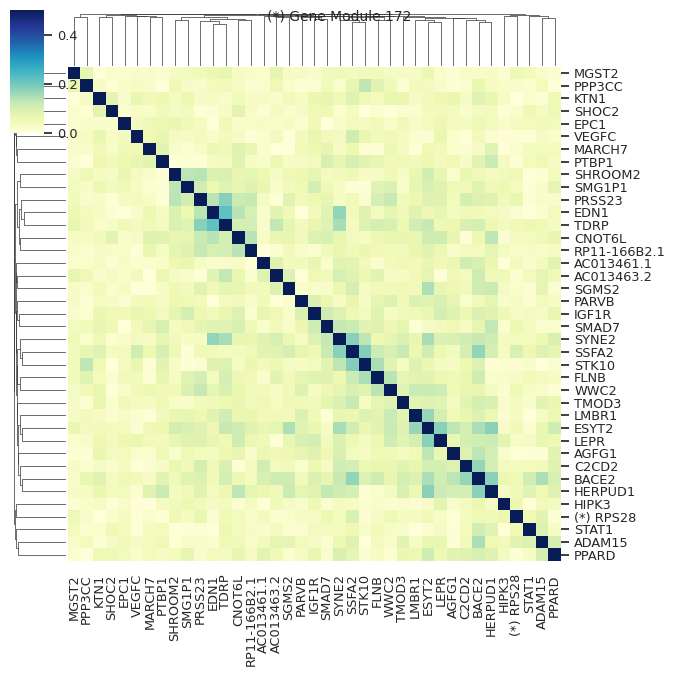

<Figure size 820x820 with 0 Axes>

<Figure size 340x340 with 0 Axes>

<Figure size 910x910 with 0 Axes>

<Figure size 760x760 with 0 Axes>

<Figure size 850x850 with 0 Axes>

<Figure size 400x400 with 0 Axes>

<Figure size 1060x1060 with 0 Axes>

<Figure size 610x610 with 0 Axes>

<Figure size 415x415 with 0 Axes>

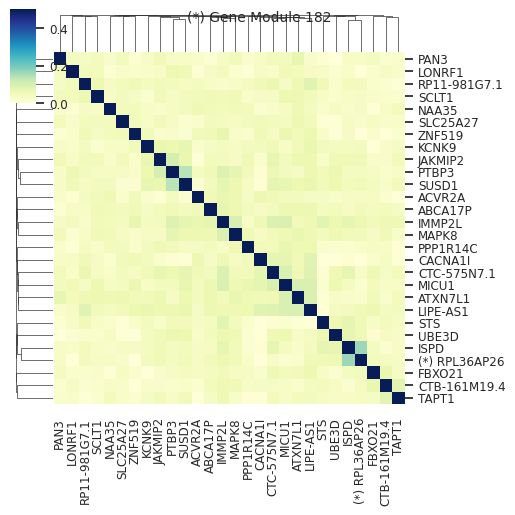

<Figure size 880x880 with 0 Axes>

<Figure size 955x955 with 0 Axes>

<Figure size 460x460 with 0 Axes>

<Figure size 805x805 with 0 Axes>

<Figure size 280x280 with 0 Axes>

<Figure size 640x640 with 0 Axes>

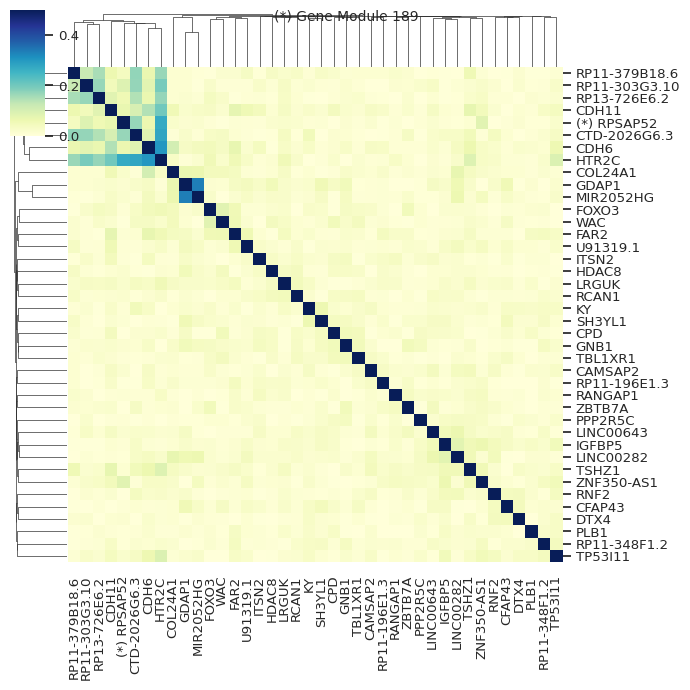

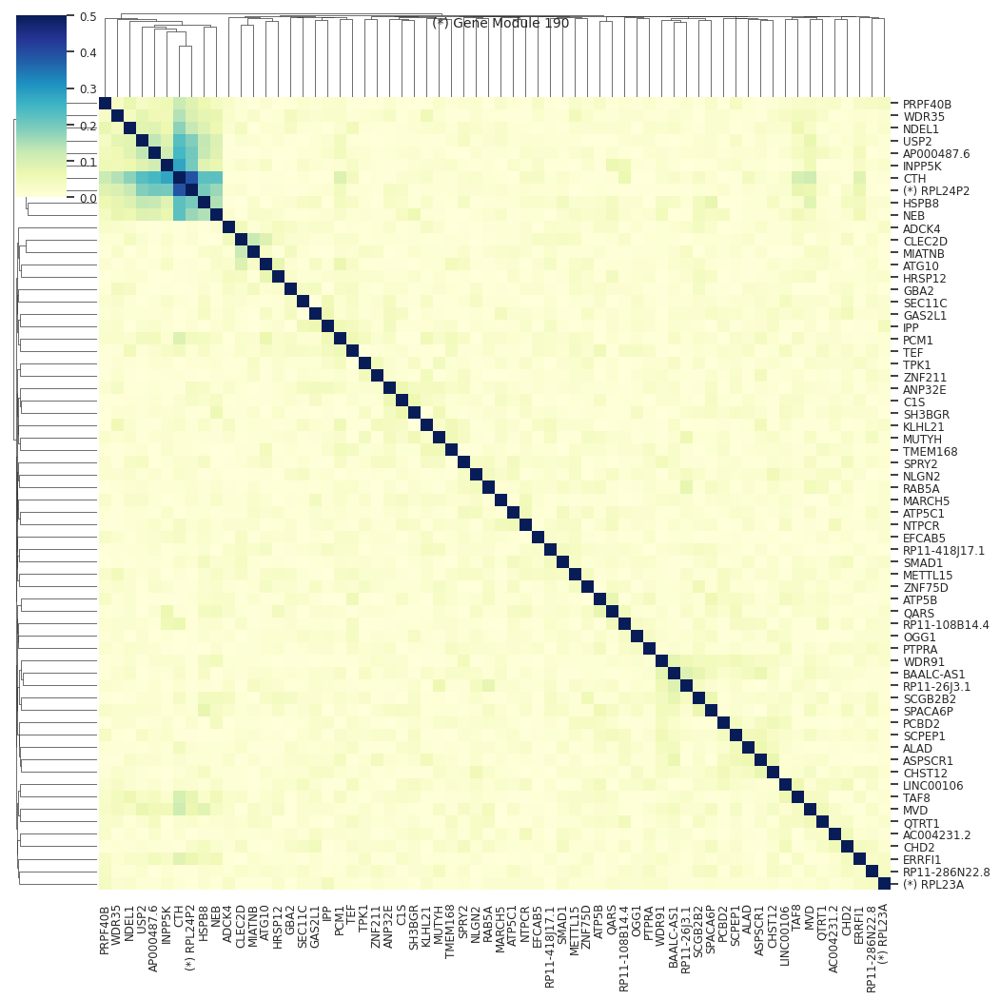

<Figure size 895x895 with 0 Axes>

<Figure size 820x820 with 0 Axes>

<Figure size 430x430 with 0 Axes>

<Figure size 925x925 with 0 Axes>

<Figure size 985x985 with 0 Axes>

<Figure size 880x880 with 0 Axes>

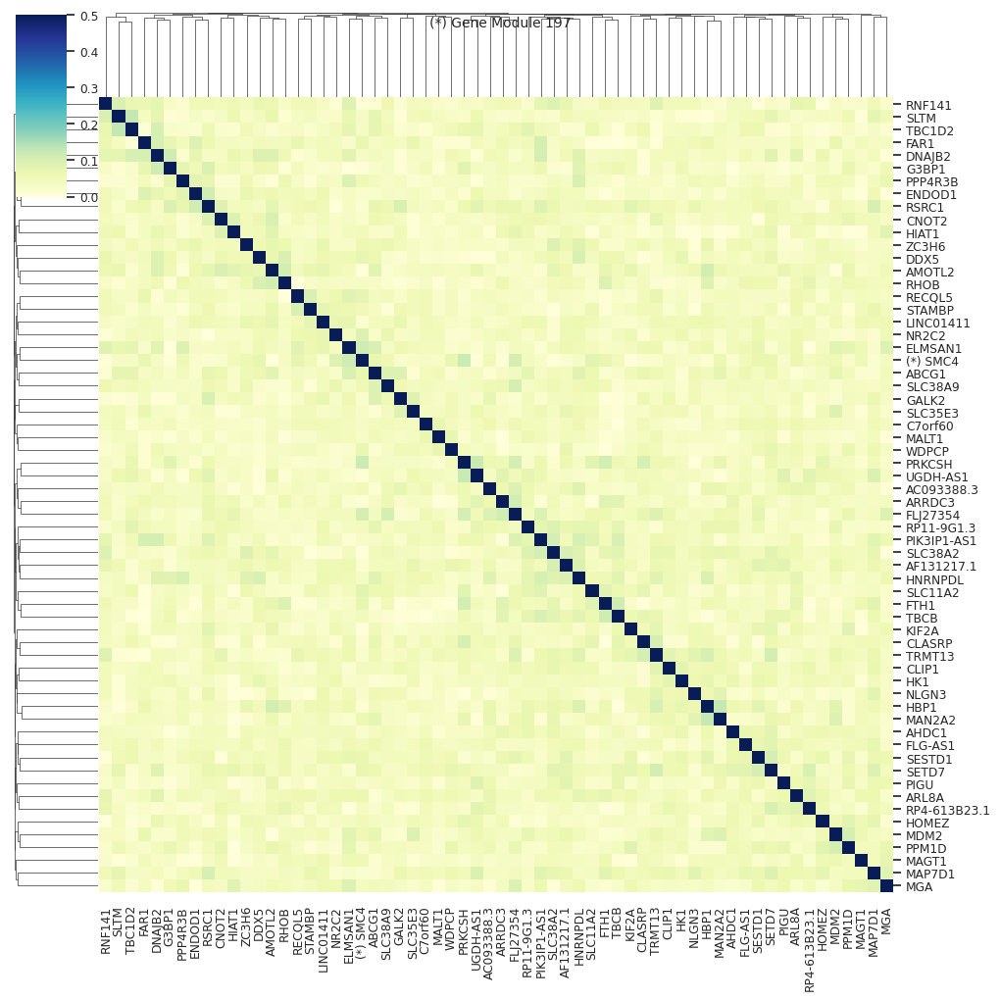

<Figure size 430x430 with 0 Axes>

<Figure size 700x700 with 0 Axes>

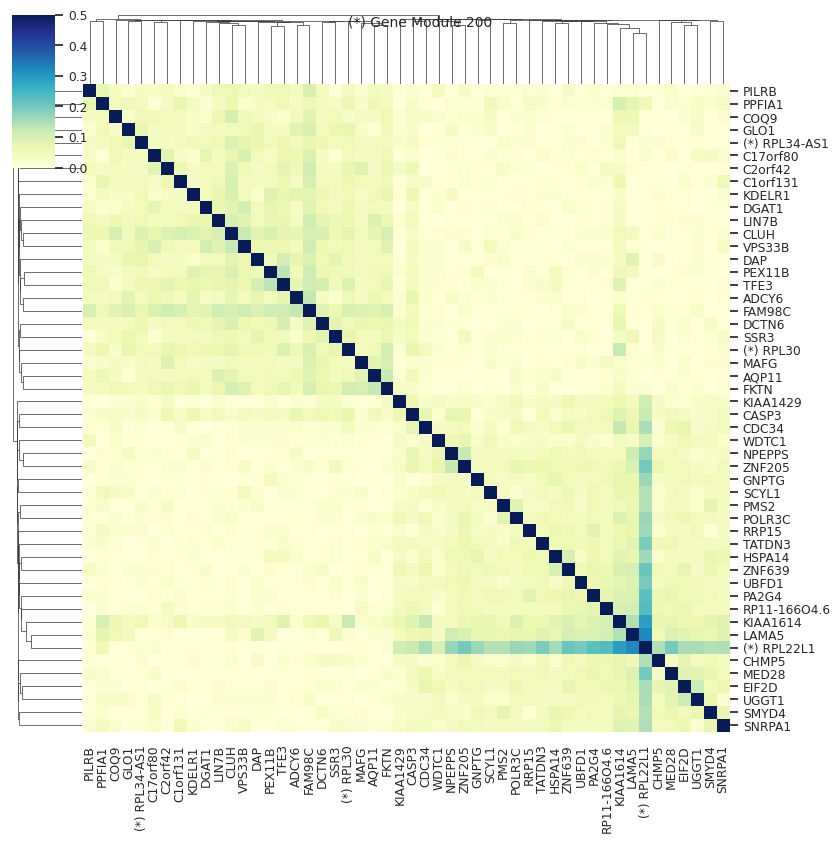

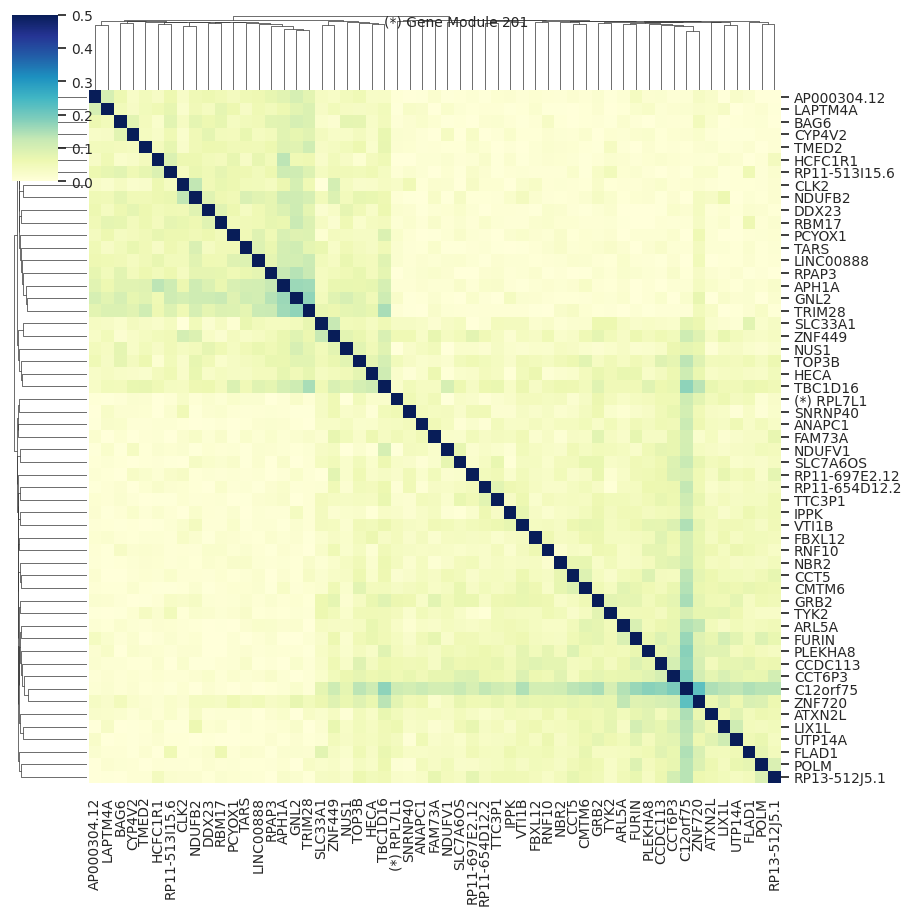

<Figure size 850x850 with 0 Axes>

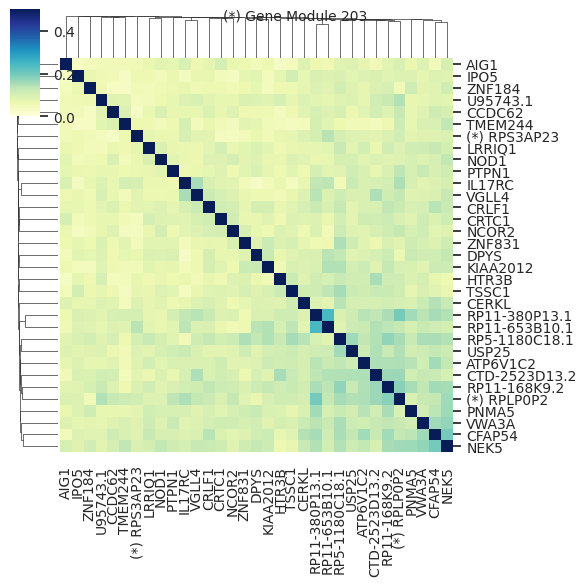

<Figure size 490x490 with 0 Axes>

<Figure size 1015x1015 with 0 Axes>

<Figure size 640x640 with 0 Axes>

<Figure size 520x520 with 0 Axes>

<Figure size 625x625 with 0 Axes>

<Figure size 370x370 with 0 Axes>

<Figure size 265x265 with 0 Axes>

<Figure size 955x955 with 0 Axes>

<Figure size 925x925 with 0 Axes>

<Figure size 760x760 with 0 Axes>

<Figure size 700x700 with 0 Axes>

<Figure size 595x595 with 0 Axes>

<Figure size 565x565 with 0 Axes>

<Figure size 835x835 with 0 Axes>

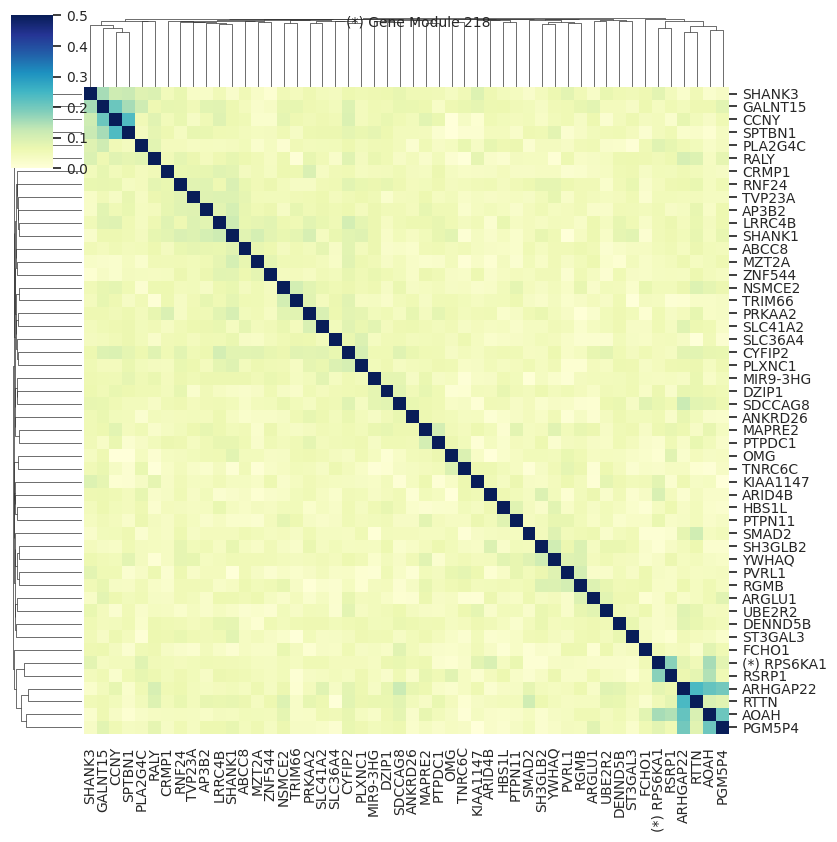

<Figure size 895x895 with 0 Axes>

<Figure size 325x325 with 0 Axes>

<Figure size 895x895 with 0 Axes>

<Figure size 1030x1030 with 0 Axes>

<Figure size 595x595 with 0 Axes>

<Figure size 625x625 with 0 Axes>

<Figure size 850x850 with 0 Axes>

<Figure size 505x505 with 0 Axes>

<Figure size 610x610 with 0 Axes>

<Figure size 970x970 with 0 Axes>

<Figure size 775x775 with 0 Axes>

<Figure size 490x490 with 0 Axes>

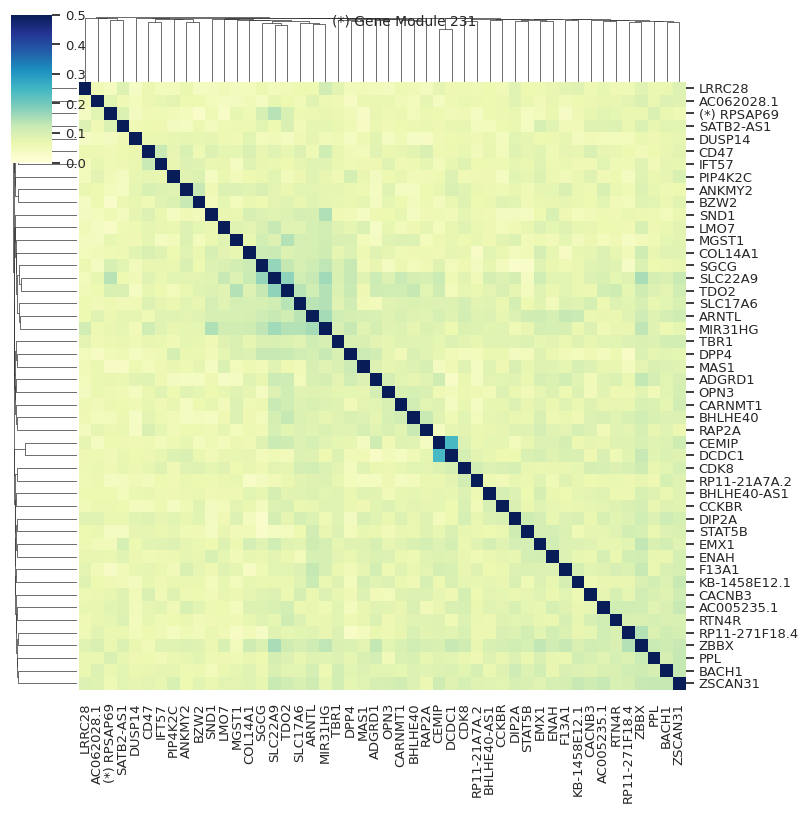

<Figure size 610x610 with 0 Axes>

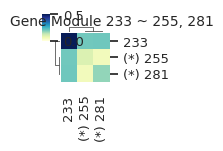

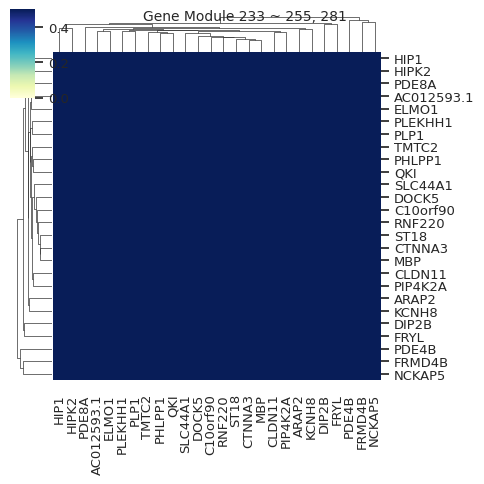

<Figure size 670x670 with 0 Axes>

<Figure size 865x865 with 0 Axes>

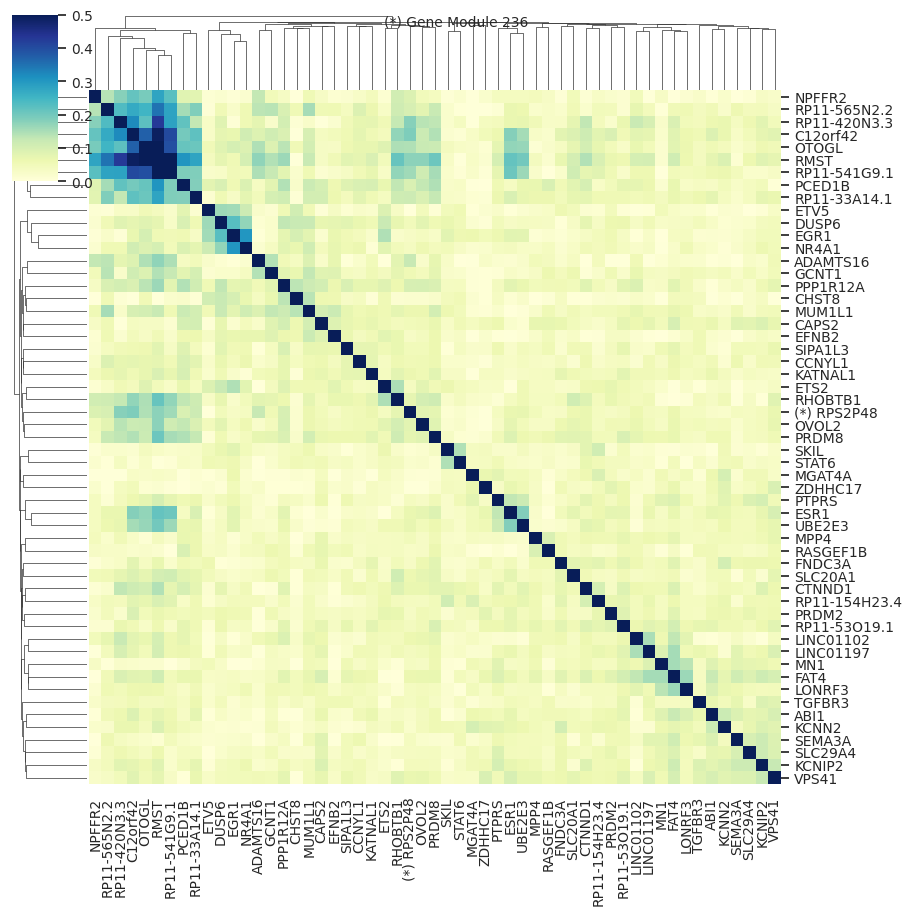

<Figure size 610x610 with 0 Axes>

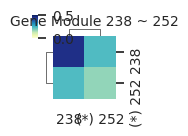

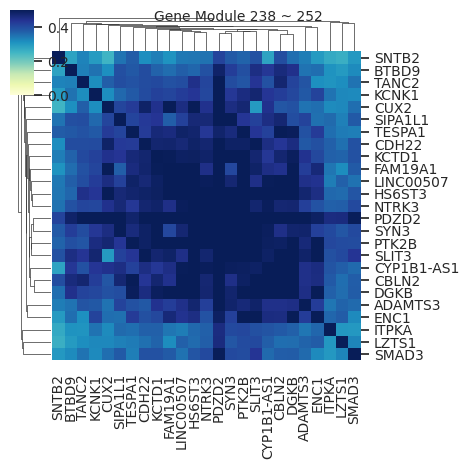

<Figure size 760x760 with 0 Axes>

<Figure size 865x865 with 0 Axes>

<Figure size 595x595 with 0 Axes>

<Figure size 550x550 with 0 Axes>

<Figure size 325x325 with 0 Axes>

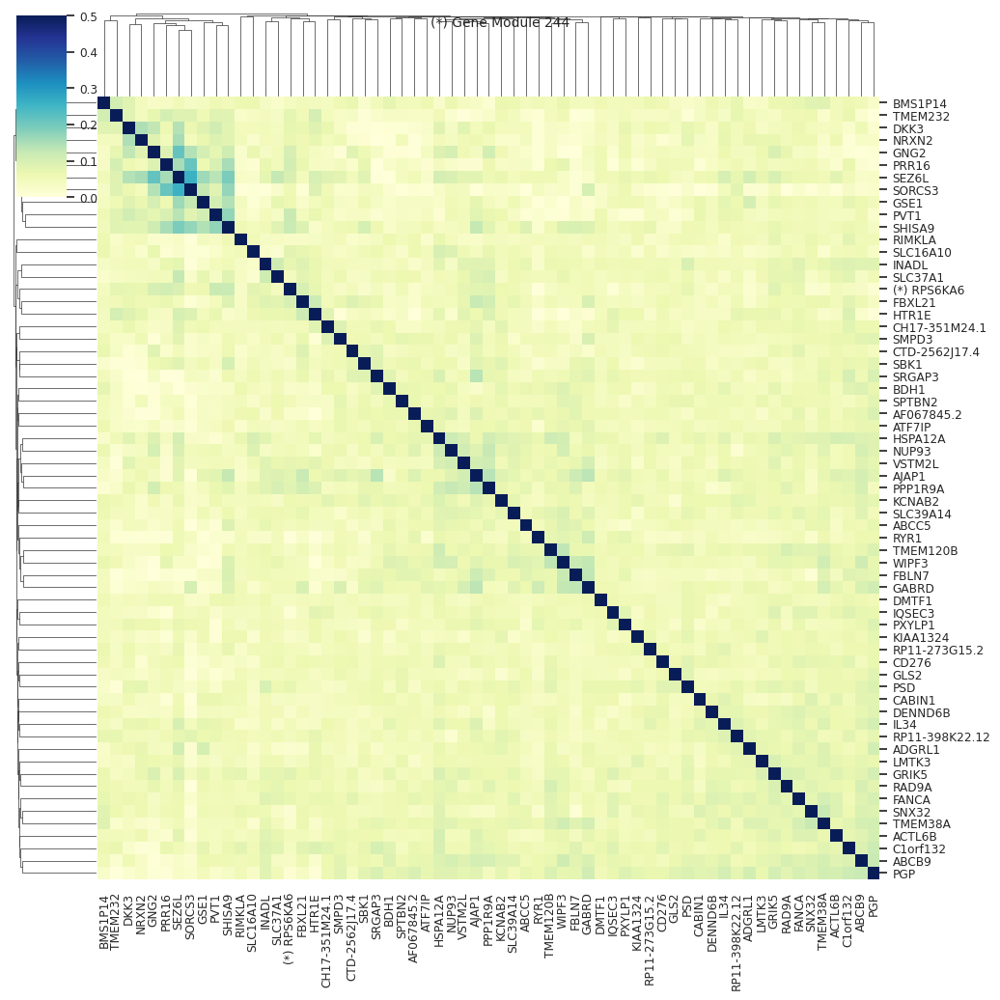

<Figure size 625x625 with 0 Axes>

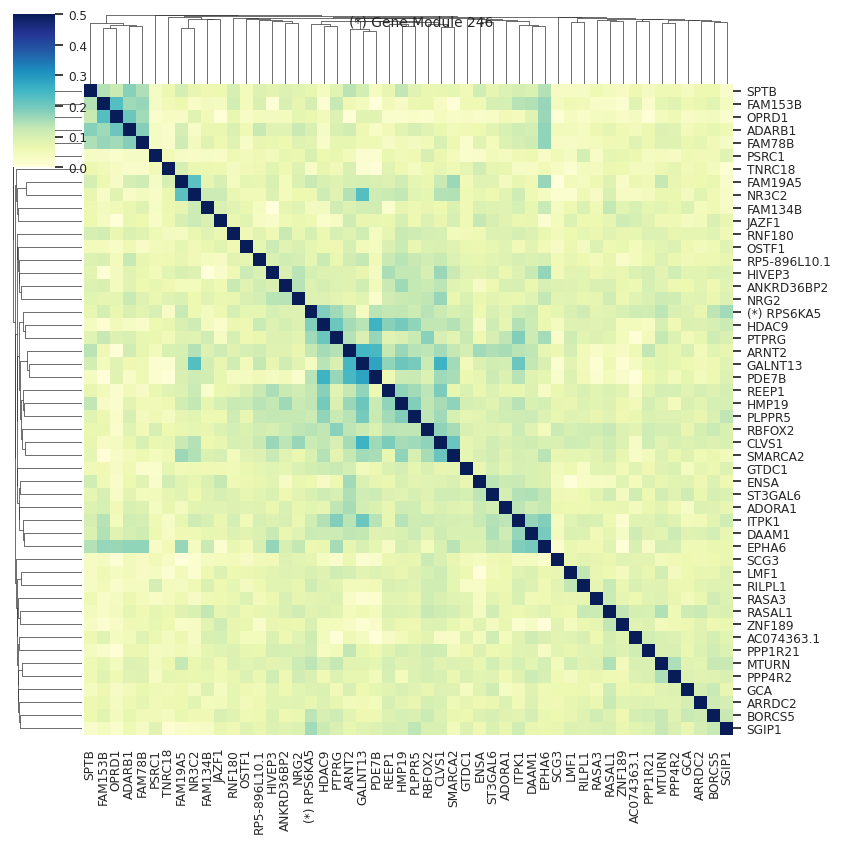

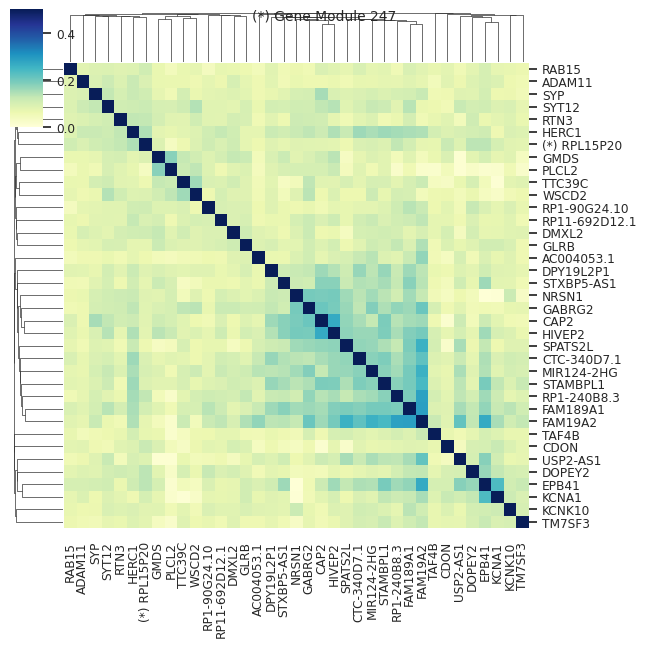

<Figure size 535x535 with 0 Axes>

<Figure size 505x505 with 0 Axes>

<Figure size 955x955 with 0 Axes>

<Figure size 655x655 with 0 Axes>

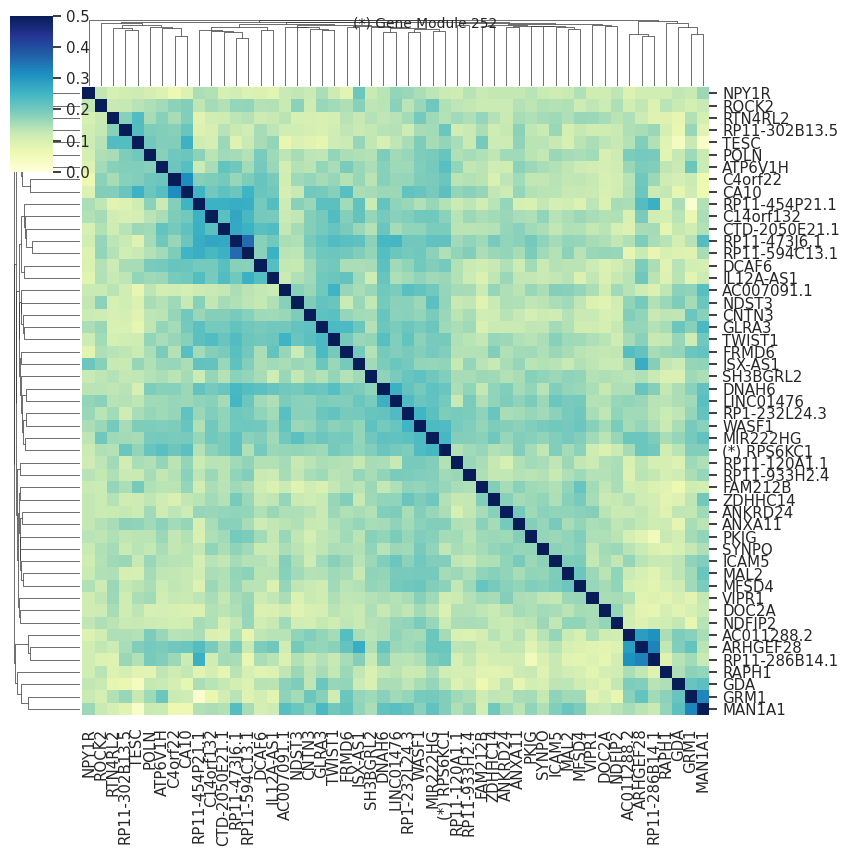

<Figure size 925x925 with 0 Axes>

<Figure size 385x385 with 0 Axes>

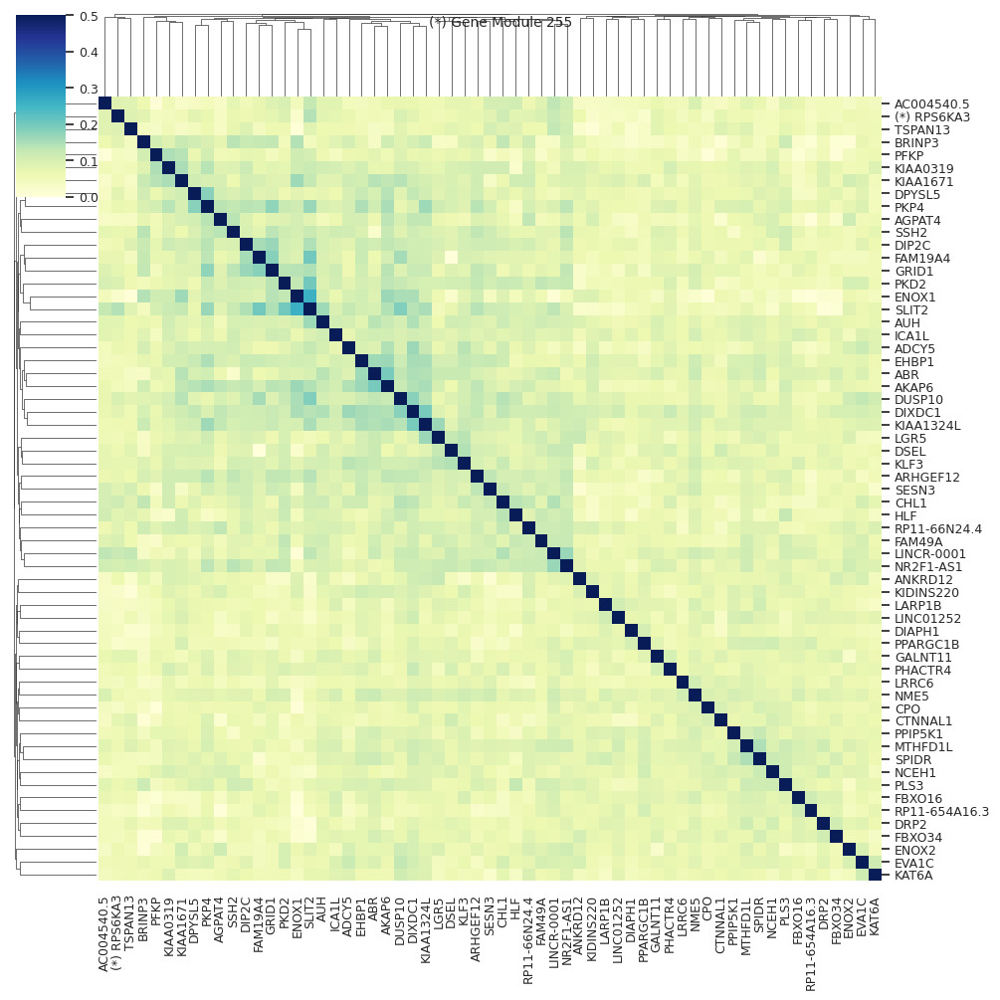

<Figure size 655x655 with 0 Axes>

<Figure size 760x760 with 0 Axes>

<Figure size 1045x1045 with 0 Axes>

<Figure size 685x685 with 0 Axes>

<Figure size 595x595 with 0 Axes>

<Figure size 850x850 with 0 Axes>

<Figure size 880x880 with 0 Axes>

<Figure size 700x700 with 0 Axes>

<Figure size 670x670 with 0 Axes>

<Figure size 355x355 with 0 Axes>

<Figure size 580x580 with 0 Axes>

<Figure size 565x565 with 0 Axes>

<Figure size 535x535 with 0 Axes>

<Figure size 970x970 with 0 Axes>

<Figure size 400x400 with 0 Axes>

<Figure size 1045x1045 with 0 Axes>

<Figure size 1030x1030 with 0 Axes>

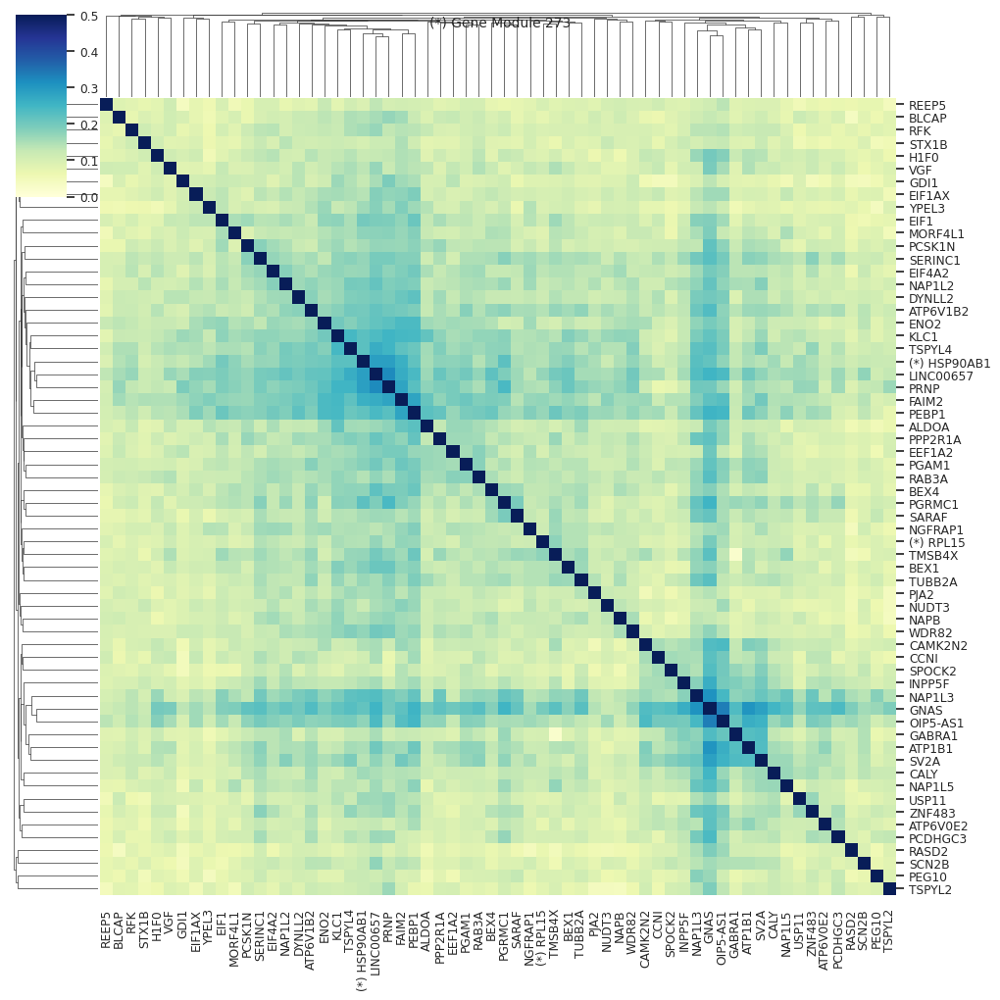

<Figure size 790x790 with 0 Axes>

<Figure size 1060x1060 with 0 Axes>

<Figure size 820x820 with 0 Axes>

<Figure size 865x865 with 0 Axes>

<Figure size 1030x1030 with 0 Axes>

<Figure size 625x625 with 0 Axes>

<Figure size 865x865 with 0 Axes>

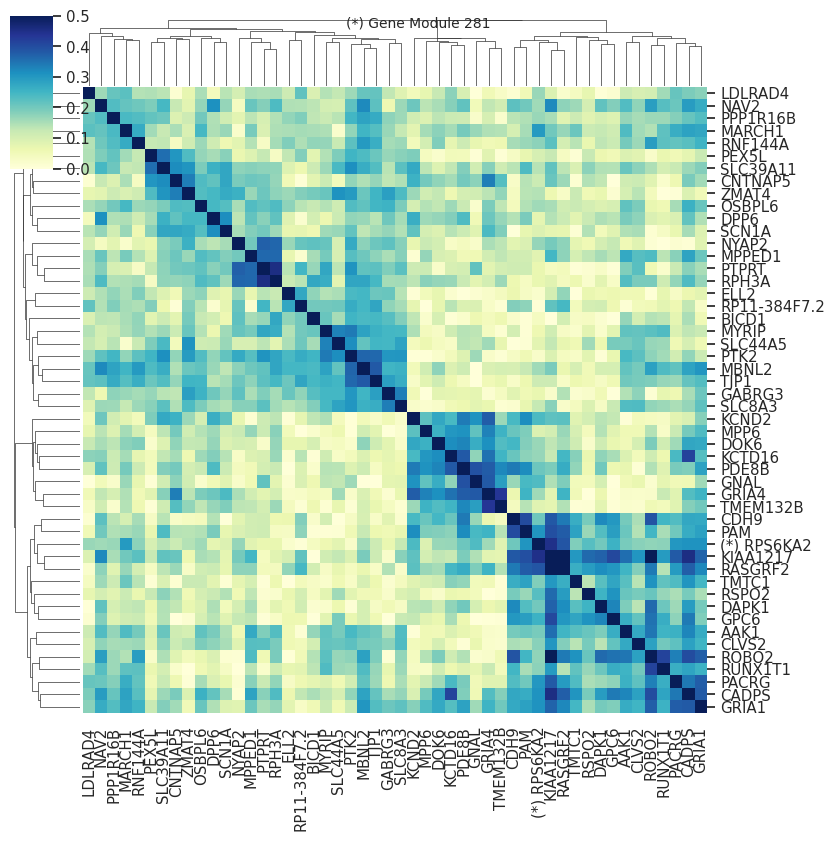

<Figure size 1000x1000 with 0 Axes>

<Figure size 760x760 with 0 Axes>

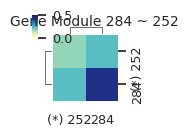

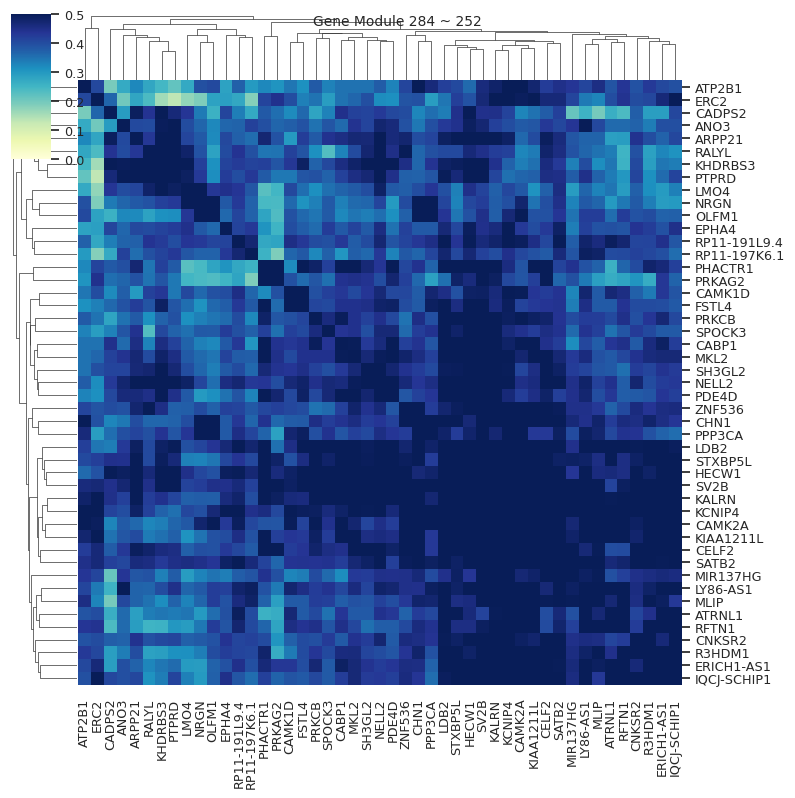

<Figure size 640x640 with 0 Axes>

<Figure size 925x925 with 0 Axes>

In [38]:
for gene_module in range(np.max(module_per_gene) + 1):
    module_genes_mask = module_per_gene.values == gene_module
    if module_per_gene[module_per_gene.values == gene_module].size > 1:
        similarity_of_module = similarity_of_genes.loc[module_genes_mask, module_genes_mask]
        similarity_of_module.index = similarity_of_module.columns = [
            "(*) " + name if name in base_lateral_gene_names else name
            for name in similarity_of_module.index
        ]

        mask = similarity_of_module.values.copy()
        np.fill_diagonal(mask, 0.0)
        max_value = np.max(mask)
        show_in_notebook = gene_module in base_lateral_gene_modules or max_value >= MIN_SIMILARITY_TO_SHOW

        similarity_to_laterals = similarity_of_modules.iloc[gene_module, base_lateral_gene_modules]
        similar_lateral_modules_mask = similarity_to_laterals >= SHOW_CORRELATED_MODULES
        similar_lateral_modules = base_lateral_gene_modules[np.where(similar_lateral_modules_mask)[0]]
        if gene_module not in base_lateral_gene_modules and len(similar_lateral_modules) == 0:
            show_in_notebook = False

        prefix = "(*) " if gene_module in base_lateral_gene_modules else ""
        suffix = ", ".join([
            str(similar_lateral_module)
            for similar_lateral_module
            in similar_lateral_modules
            if similar_lateral_module != gene_module
        ])
        if suffix != "":
            suffix = " ~ " + suffix
        title = f"{prefix}Gene Module {gene_module}{suffix}"

        if len(similar_lateral_modules) > 0:
            with_lateral_modules = set(similar_lateral_modules)
            with_lateral_modules.add(gene_module)
            with_lateral_modules = sorted(with_lateral_modules)
            if len(with_lateral_modules) > 1:
                similarity_with_module = \
                    similarity_of_modules.iloc[with_lateral_modules, :].iloc[:, with_lateral_modules]

                size = similarity_with_module.shape[0]
                if size > 50:
                    sb.set(font_scale=50 / size)
                size = size * 0.15 + 1
                cm = sb.clustermap(
                    similarity_with_module,
                    figsize=(size, size),
                    vmin=0, vmax=0.5,
                    xticklabels=True, yticklabels=True,
                    dendrogram_ratio=0.1,
                    cmap="YlGnBu",
                )
                cm.fig.suptitle(title, fontsize=10)
                if show_in_notebook:
                    plt.show()
                else:
                    plt.clf()

        size = similarity_of_module.shape[0]
        if size > 50:
            sb.set(font_scale=50 / size)
        size = size * 0.15 + 1
        cm = sb.clustermap(
            similarity_of_module,
            figsize=(size, size),
            vmin=0, vmax=0.5,
            xticklabels=True, yticklabels=True,
            dendrogram_ratio=0.1,
            cmap="YlGnBu",
        )
        cm.fig.suptitle(title, fontsize=10)
        if show_in_notebook:
            plt.show()
        else:
            plt.clf()

In [39]:
LATERAL_GENE_MODULES = [
   129, 133,
]
SPECIFIC_LATERAL_GENES = ["DUSP1"]  # Stress

In [40]:
for gene_module in LATERAL_GENE_MODULES:
    module_genes_mask = module_per_gene == gene_module
    update_lateral_genes(names=cells.var_names[module_genes_mask], op="add", show=False)
update_lateral_genes(names=SPECIFIC_LATERAL_GENES, op="add", show=False)


set chimp_mtg_iteration1.var[lateral_gene]: 768 true (1.889%) out of 40650 bools
set chimp_mtg_iteration1.var[lateral_gene]: 781 true (1.921%) out of 40650 bools
set chimp_mtg_iteration1.var[lateral_gene]: 782 true (1.924%) out of 40650 bools


In [41]:
# Either use the guesstimator:
max_parallel_piles = mc.pl.guess_max_parallel_piles(cells)
# Or, if running out of memory manually override:
# max_paralle_piles = ...
print(max_parallel_piles)
mc.pl.set_max_parallel_piles(max_parallel_piles)

333


In [42]:
with mc.ut.progress_bar():
    mc.pl.divide_and_conquer_pipeline(cells, random_seed=123456, )

Detect rare gene modules...
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
  0%|          [00:00]/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/

In [43]:
metacells = mc.pl.collect_metacells(cells, name="chimp_mtg_metacells", random_seed=123456)
print(f"Iteration 1: {metacells.n_obs} metacells, {metacells.n_vars} genes")

set chimp_mtg_metacells.obs[grouped]: 5209 int64s
set chimp_mtg_metacells.obs[total_umis]: 5209 int64s
set chimp_mtg_metacells.layers[total_umis]: ndarray 5209 X 40650 float32s
set chimp_mtg_metacells.obs[__zeros_downsample_umis]: 5209 int64s
set chimp_mtg_metacells.layers[zeros]: ndarray 5209 X 40650 int32s
set chimp_mtg_iteration1.obs[metacell_name]: 109096 <U8s
set chimp_mtg_metacells.var[name]: 40650 objects
set chimp_mtg_metacells.var[bursty_lonely_gene]: 0 true (0%) out of 40650 bools
set chimp_mtg_metacells.var[properly_sampled_gene]: 40650 true (100%) out of 40650 bools
set chimp_mtg_metacells.var[excluded_gene]: 0 true (0%) out of 40650 bools
set chimp_mtg_metacells.var[full_gene_index]: 40650 int32s
set chimp_mtg_metacells.var[lateral_gene]: 782 true (1.924%) out of 40650 bools
set chimp_mtg_metacells.var[lateral_genes_module]: 40650 int32s
set chimp_mtg_metacells.var[selected_gene]: 8327 true (20.48%) out of 40650 bools
set chimp_mtg_metacells.var[rare_gene]: 0 true (0%) out

Iteration 1: 5209 metacells, 40650 genes


In [64]:
metacells

AnnData object with n_obs × n_vars = 5209 × 40650
    obs: 'grouped', 'total_umis', '__zeros_downsample_umis', 'metacells_rare_gene_module', 'rare_metacell', 'cell_type', 'cell_type_fraction_of_L2/3-6 intratelencephalic projecting glutamatergic cortical neuron', 'cell_type_fraction_of_L5 extratelencephalic projecting glutamatergic cortical neuron', 'cell_type_fraction_of_L6b glutamatergic cortical neuron', 'cell_type_fraction_of_astrocyte of the cerebral cortex', 'cell_type_fraction_of_caudal ganglionic eminence derived GABAergic cortical interneuron', 'cell_type_fraction_of_cerebral cortex endothelial cell', 'cell_type_fraction_of_chandelier pvalb GABAergic cortical interneuron', 'cell_type_fraction_of_corticothalamic-projecting glutamatergic cortical neuron', 'cell_type_fraction_of_lamp5 GABAergic cortical interneuron', 'cell_type_fraction_of_microglial cell', 'cell_type_fraction_of_near-projecting glutamatergic cortical neuron', 'cell_type_fraction_of_oligodendrocyte', 'cell_type_fr

In [65]:
cells.obs

,orig.ident,nCount_RNA,nFeature_RNA,...1,Cluster,Neighborhood,Subclass,CrossSpeciesCluster,assay_ontology_term_id,cell_type_ontology_term_id,...,excluded_umis,properly_sampled_cell,excluded_cell,full_cell_index,metacell,dissolved,metacell_level,cells_rare_gene_module,rare_cell,metacell_name
AAACCCACATGAGAAT-1L8TX_190822_01_F11,SeuratProject,6572.0,2695.0,AAACCCACATGAGAAT-1L8TX_190822_01_F11,Oligo_1,glia,Oligo,Oligo_1,EFO:0009922,CL:0000128,...,176.0,True,False,0,2155,False,1,-1,False,M2155.13
AAACCCAGTGACTGAG-1L8TX_190822_01_F11,SeuratProject,1649.0,1069.0,AAACCCAGTGACTGAG-1L8TX_190822_01_F11,Oligo_1,glia,Oligo,Oligo_1,EFO:0009922,CL:0000128,...,20.0,True,False,1,2279,False,1,-1,False,M2279.61
AAACCCATCCGTACGG-1L8TX_190822_01_F11,SeuratProject,1936.0,1364.0,AAACCCATCCGTACGG-1L8TX_190822_01_F11,Micro-PVM_1,glia,Micro-PVM,Micro-PVM_1,EFO:0009922,CL:0000129,...,27.0,True,False,2,-1,False,2,-1,False,Outliers
AAACGAAAGGCCTTGC-1L8TX_190822_01_F11,SeuratProject,4743.0,2120.0,AAACGAAAGGCCTTGC-1L8TX_190822_01_F11,Oligo_1,glia,Oligo,Oligo_1,EFO:0009922,CL:0000128,...,141.0,True,False,3,2136,False,1,-1,False,M2136.52
AAACGAATCATCGCTC-1L8TX_190822_01_F11,SeuratProject,4899.0,2310.0,AAACGAATCATCGCTC-1L8TX_190822_01_F11,Astro_1,glia,Astro,Astro_1,EFO:0009922,CL:0002605,...,153.0,True,False,4,2849,False,1,-1,False,M2849.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTATAGGAT-14L8TX_191217_01_C07,SeuratProject,14029.0,4624.0,TTTGTTGGTATAGGAT-14L8TX_191217_01_C07,L2/3 IT_3,it_types,L2/3 IT,L2/3 IT_1,EFO:0009922,CL:4023040,...,271.0,True,False,109091,3438,False,1,-1,False,M3438.89
TTTGTTGGTCTTTATC-14L8TX_191217_01_C07,SeuratProject,40515.0,7989.0,TTTGTTGGTCTTTATC-14L8TX_191217_01_C07,L5 IT_3,it_types,L5 IT,L5 IT_2,EFO:0009922,CL:4023040,...,772.0,True,False,109092,-1,False,2,-1,False,Outliers
TTTGTTGGTTGGGTAG-14L8TX_191217_01_C07,SeuratProject,19032.0,5918.0,TTTGTTGGTTGGGTAG-14L8TX_191217_01_C07,L4 IT_1,it_types,L4 IT,L4 IT_1,EFO:0009922,CL:4023040,...,587.0,True,False,109093,3204,False,1,-1,False,M3204.18
TTTGTTGGTTTGTGGT-14L8TX_191217_01_C07,SeuratProject,21077.0,5794.0,TTTGTTGGTTTGTGGT-14L8TX_191217_01_C07,L4 IT_1,it_types,L4 IT,L4 IT_1,EFO:0009922,CL:4023040,...,510.0,True,False,109094,3565,False,1,-1,False,M3565.53


In [66]:
# We'll reuse this through the iterations.
def convey_cell_annotations_to_metacells(anno_col, anno_col_target) -> None:
    
    # Assign a single value for each metacell based on the cells.
    mc.tl.convey_obs_to_group(
        adata=cells, gdata=metacells,
        property_name=anno_col, to_property_name=anno_col_target,
        method=mc.ut.most_frequent  # This is the default, for categorical data
    )

    # Compute the fraction of cells with each possible value in each metacell:
    mc.tl.convey_obs_fractions_to_group(
        adata=cells, gdata=metacells,
        property_name=anno_col, to_property_name=anno_col_target,
    )

    
convey_cell_annotations_to_metacells(anno_col='Subclass', anno_col_target='Subclass')

set chimp_mtg_metacells.obs[Subclass]: 5209 <U10s
set chimp_mtg_metacells.obs[Subclass_fraction_of_Astro]: 5209 float64s
set chimp_mtg_metacells.obs[Subclass_fraction_of_Chandelier]: 5209 float64s
set chimp_mtg_metacells.obs[Subclass_fraction_of_Endo]: 5209 float64s
set chimp_mtg_metacells.obs[Subclass_fraction_of_L2/3 IT]: 5209 float64s
set chimp_mtg_metacells.obs[Subclass_fraction_of_L4 IT]: 5209 float64s
set chimp_mtg_metacells.obs[Subclass_fraction_of_L5 ET]: 5209 float64s
set chimp_mtg_metacells.obs[Subclass_fraction_of_L5 IT]: 5209 float64s
set chimp_mtg_metacells.obs[Subclass_fraction_of_L5/6 NP]: 5209 float64s
set chimp_mtg_metacells.obs[Subclass_fraction_of_L6 CT]: 5209 float64s
set chimp_mtg_metacells.obs[Subclass_fraction_of_L6 IT]: 5209 float64s
set chimp_mtg_metacells.obs[Subclass_fraction_of_L6 IT Car3]: 5209 float64s
set chimp_mtg_metacells.obs[Subclass_fraction_of_L6b]: 5209 float64s
set chimp_mtg_metacells.obs[Subclass_fraction_of_Lamp5]: 5209 float64s
set chimp_mtg_me

In [67]:
set(metacells.obs.Subclass.astype('category').cat.categories).symmetric_difference(set(adata_10x.obs.Subclass.cat.categories))

set()

In [54]:
## fix this by trying to make metacells again

In [68]:
metacells.write("chimp_metacells_subclass.h5ad")

In [69]:
import gc
gc.collect()

169

In [62]:
adata_10x.obs['Subclass'].cat.categories

Index(['Astro', 'Chandelier', 'Endo', 'L2/3 IT', 'L4 IT', 'L5 ET', 'L5 IT',
       'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Lamp5_Lhx6',
       'Micro-PVM', 'OPC', 'Oligo', 'Pax6', 'Pvalb', 'Sncg', 'Sst',
       'Sst Chodl', 'VLMC', 'Vip'],
      dtype='object')

In [63]:
adata_10x.obs['cell_type'].cat.categories

Index(['L2/3-6 intratelencephalic projecting glutamatergic cortical neuron',
       'L5 extratelencephalic projecting glutamatergic cortical neuron',
       'L6b glutamatergic cortical neuron', 'astrocyte of the cerebral cortex',
       'caudal ganglionic eminence derived GABAergic cortical interneuron',
       'cerebral cortex endothelial cell',
       'chandelier pvalb GABAergic cortical interneuron',
       'corticothalamic-projecting glutamatergic cortical neuron',
       'lamp5 GABAergic cortical interneuron', 'microglial cell',
       'near-projecting glutamatergic cortical neuron', 'oligodendrocyte',
       'oligodendrocyte precursor cell',
       'pvalb GABAergic cortical interneuron',
       'sncg GABAergic cortical interneuron',
       'sst GABAergic cortical interneuron', 'vascular leptomeningeal cell',
       'vip GABAergic cortical interneuron'],
      dtype='object')

In [70]:
cells

AnnData object with n_obs × n_vars = 109096 × 40650
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', '...1', 'Cluster', 'Neighborhood', 'Subclass', 'CrossSpeciesCluster', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'tissue_ontology_term_id', 'is_primary_data', 'donor_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_id', 'excluded_umis', 'properly_sampled_cell', 'excluded_cell', 'full_cell_index', 'metacell', 'dissolved', 'metacell_level', 'cells_rare_gene_module', 'rare_cell', 'metacell_name'
    var: 'name', 'bursty_lonely_gene', 'properly_sampled_gene', 'excluded_gene', 'full_gene_index', 'lateral_gene', 'lateral_genes_module', 'selected_gene', 'rare_gene', 'rare_gene_module'
    uns: '__name__'
    varp: 'lateral_gene

In [71]:
cells.write("chimp_single_cell_with_metacells.h5ad")

In [72]:
cl_tbl = cells.obs[['Subclass', 'cell_type', 'cell_type_ontology_term_id', 'tissue', 'tissue_ontology_term_id']].reset_index(drop=True).drop_duplicates(subset=['Subclass'])

In [74]:
cl_tbl.Subclass.cat.categories

Index(['Astro', 'Chandelier', 'Endo', 'L2/3 IT', 'L4 IT', 'L5 ET', 'L5 IT',
       'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Lamp5_Lhx6',
       'Micro-PVM', 'OPC', 'Oligo', 'Pax6', 'Pvalb', 'Sncg', 'Sst',
       'Sst Chodl', 'VLMC', 'Vip'],
      dtype='object')